In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
import pickle
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    # Iterate through sorted subfolders starting with 'Partition'
    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path) and sub_folder.startswith('Partition'):
            train_file_path = os.path.join(full_path, 'trnData.p')
            test_file_path = os.path.join(full_path, 'tstData.p')

            # Load train data if file exists
            if os.path.exists(train_file_path):
                with open(train_file_path, 'rb') as file:
                    train_data = pickle.load(file)
                    train_data_list.append(train_data)

            # Load test data if file exists
            if os.path.exists(test_file_path):
                with open(test_file_path, 'rb') as file:
                    test_data = pickle.load(file)
                    test_data_list.append(test_data)

    return train_data_list, test_data_list

folder_path = '/content/drive/MyDrive/Data/CLL_SUB'
train_data_list, test_data_list = load_data_from_folder(folder_path)
mean_acc = []

for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
    # Split data into features and target
    X_train, y_train = train_data[:, :-1], train_data[:, -1]
    X_test, y_test = test_data[:, :-1], test_data[:, -1]

    # Create DataFrame and save to CSV
    train_df = pd.DataFrame(train_data, columns=[f'feature_{j}' for j in range(train_data.shape[1]-1)] + ['target'])
    test_df = pd.DataFrame(test_data, columns=[f'feature_{j}' for j in range(test_data.shape[1]-1)] + ['target'])

    sub_folder_path = os.path.join(folder_path, f'Partition{i}')  # Adjust index if necessary
    if not os.path.exists(sub_folder_path):
        os.makedirs(sub_folder_path)

    train_df.to_csv(os.path.join(sub_folder_path, 'train_data.csv'), index=False)
    test_df.to_csv(os.path.join(sub_folder_path, 'test_data.csv'), index=False)

    # Train and evaluate the model
    model = RandomForestClassifier(n_estimators=100)
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    print(f"Partition {i}: Accuracy = {accuracy}")
    mean_acc.append(accuracy)

average_accuracy = sum(mean_acc) / len(mean_acc)
print(f"Mean Accuracy across all partitions: {average_accuracy}")


Mounted at /content/drive
Partition 0: Accuracy = 0.6481481481481481
Partition 1: Accuracy = 0.6296296296296297
Partition 2: Accuracy = 0.6296296296296297
Partition 3: Accuracy = 0.7222222222222222
Partition 4: Accuracy = 0.6481481481481481
Partition 5: Accuracy = 0.6666666666666666
Partition 6: Accuracy = 0.6481481481481481
Partition 7: Accuracy = 0.7222222222222222
Partition 8: Accuracy = 0.7777777777777778
Partition 9: Accuracy = 0.6666666666666666
Partition 10: Accuracy = 0.6481481481481481
Partition 11: Accuracy = 0.7407407407407407
Partition 12: Accuracy = 0.6111111111111112
Partition 13: Accuracy = 0.5925925925925926
Partition 14: Accuracy = 0.6296296296296297
Partition 15: Accuracy = 0.6296296296296297
Partition 16: Accuracy = 0.7222222222222222
Partition 17: Accuracy = 0.5925925925925926
Mean Accuracy across all partitions: 0.662551440329218


Processing /content/drive/MyDrive/Data/CLL_SUB/Partition18/train_data.csv


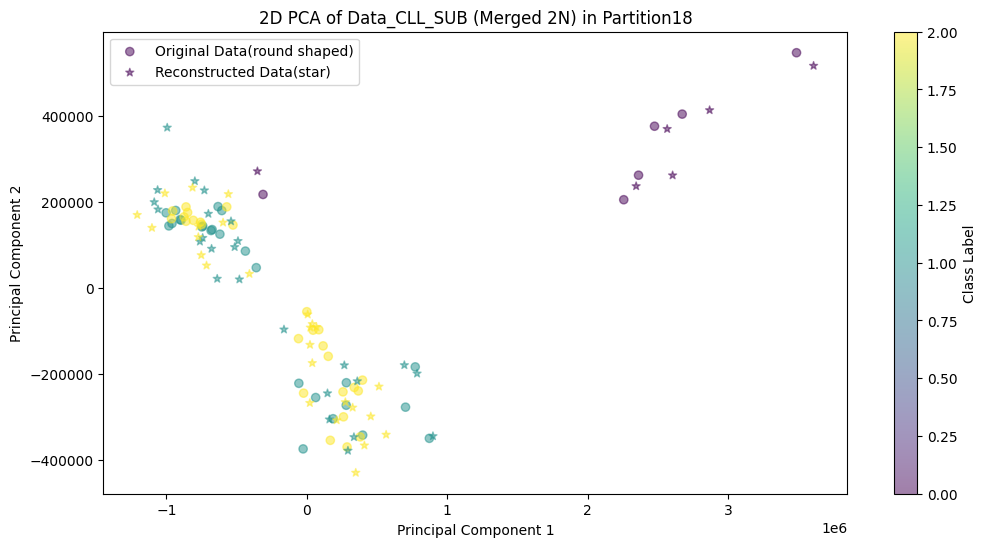

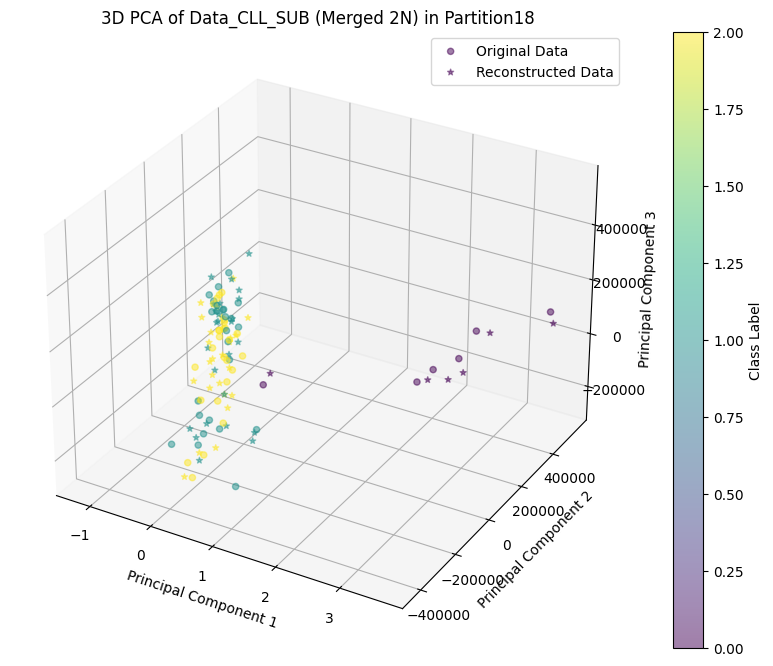

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition0/train_data.csv


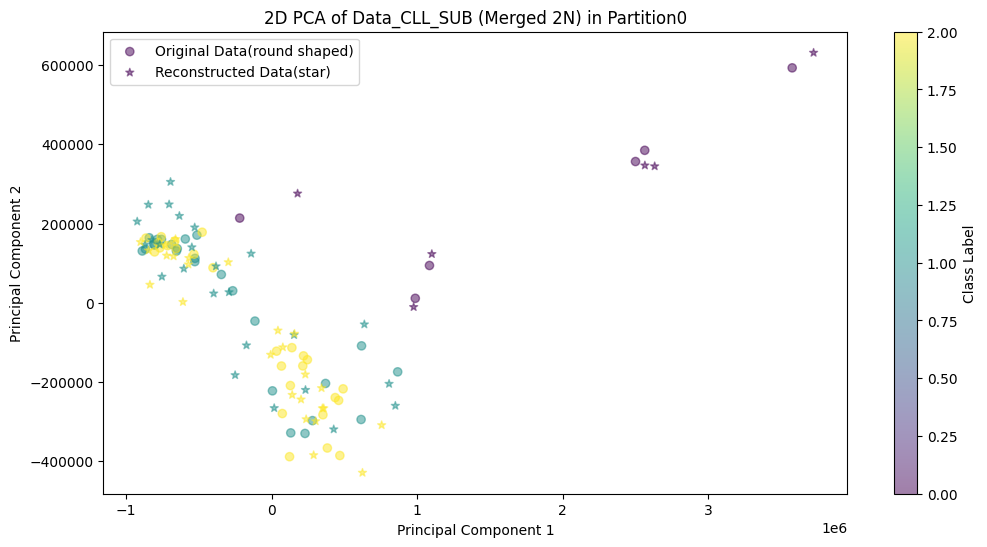

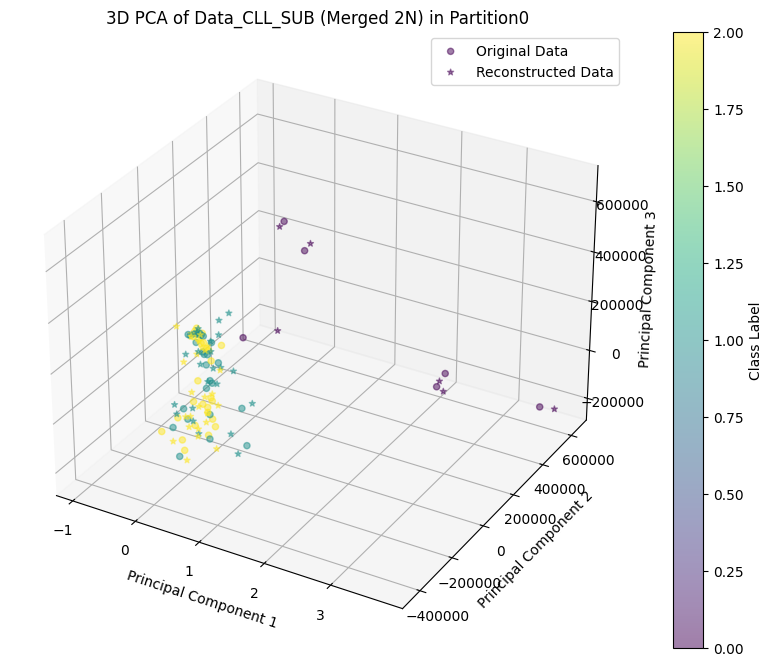

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition11/train_data.csv


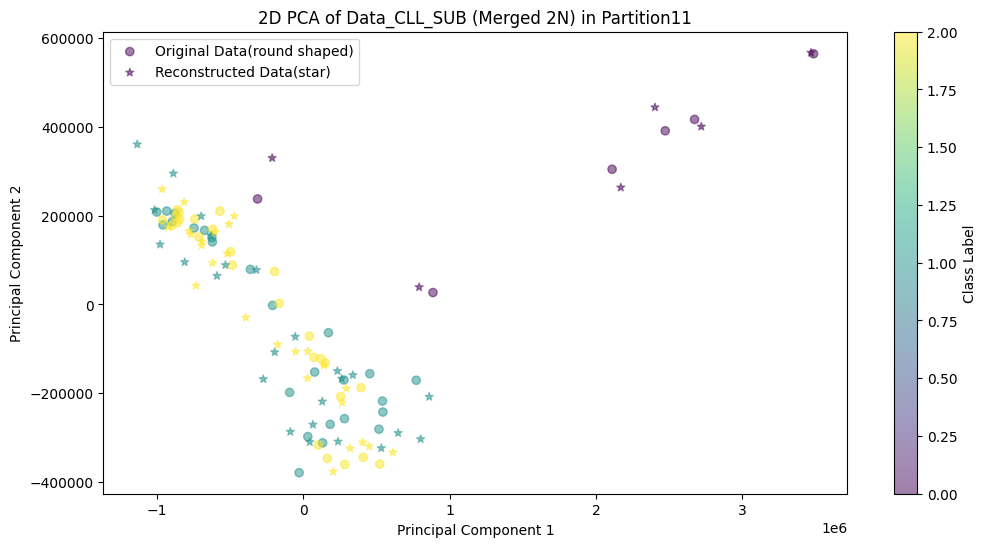

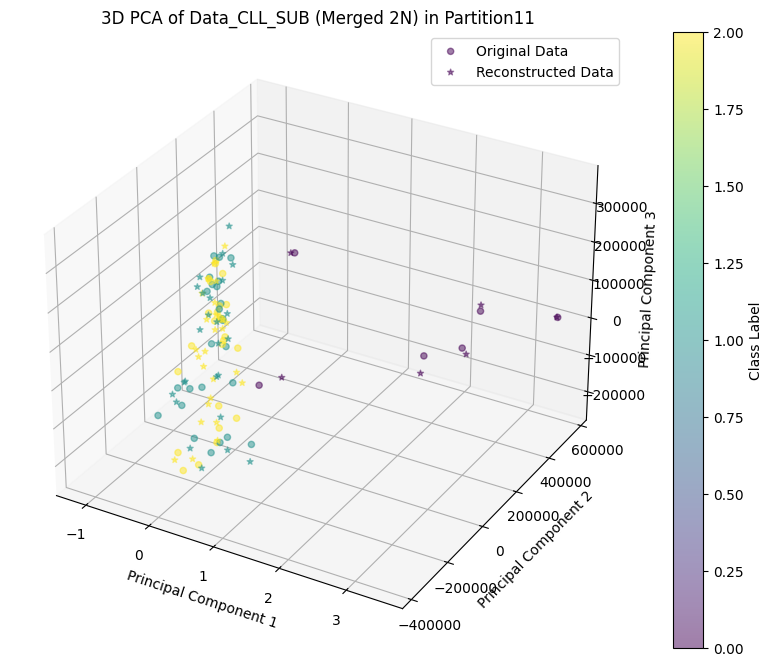

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition16/train_data.csv


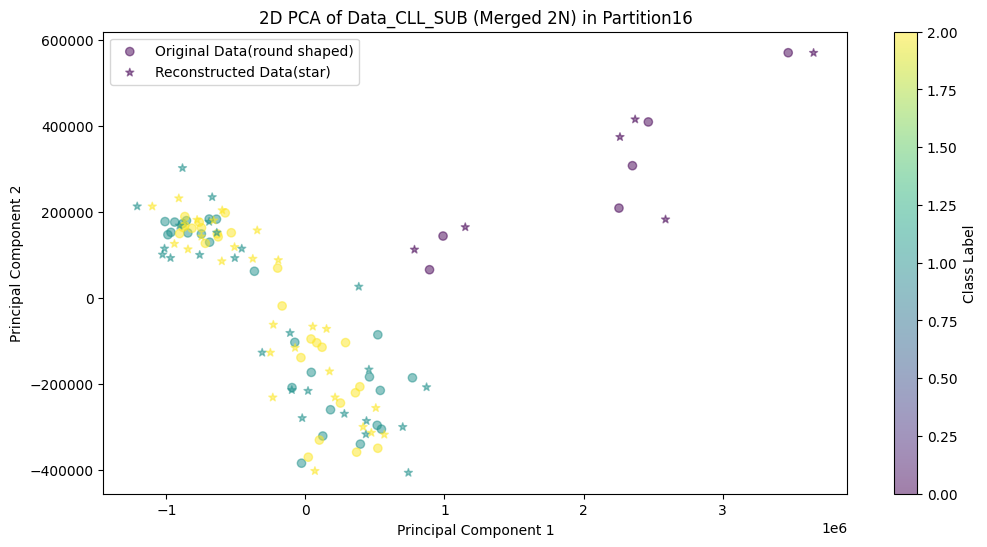

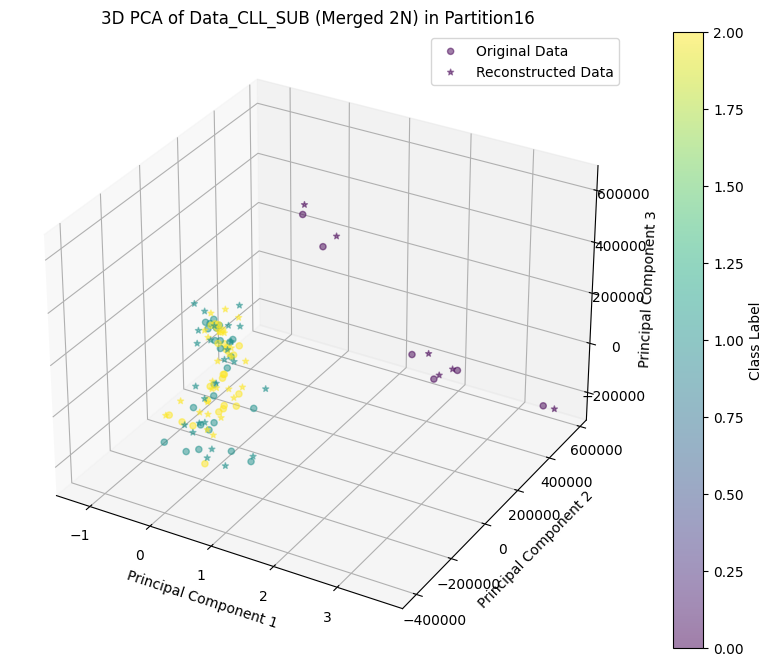

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition10/train_data.csv


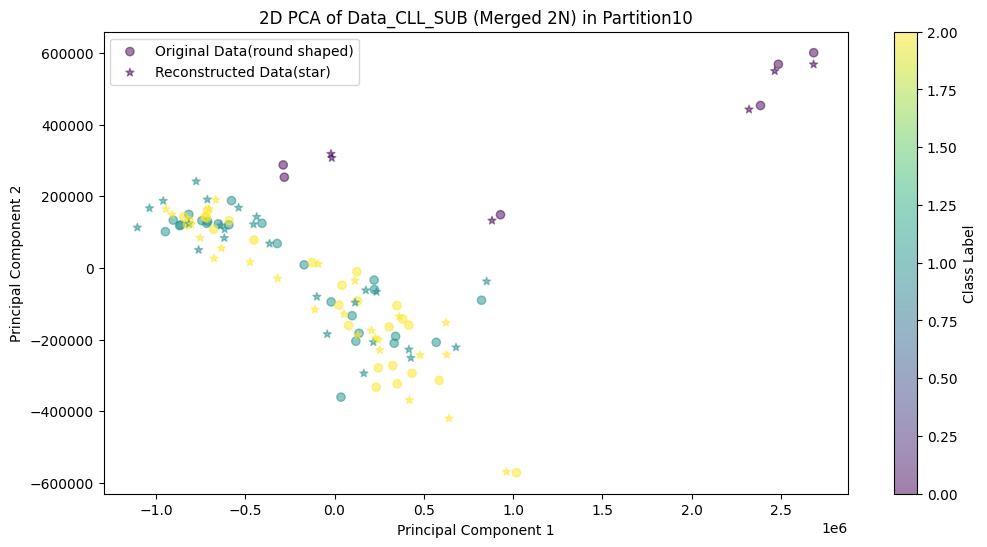

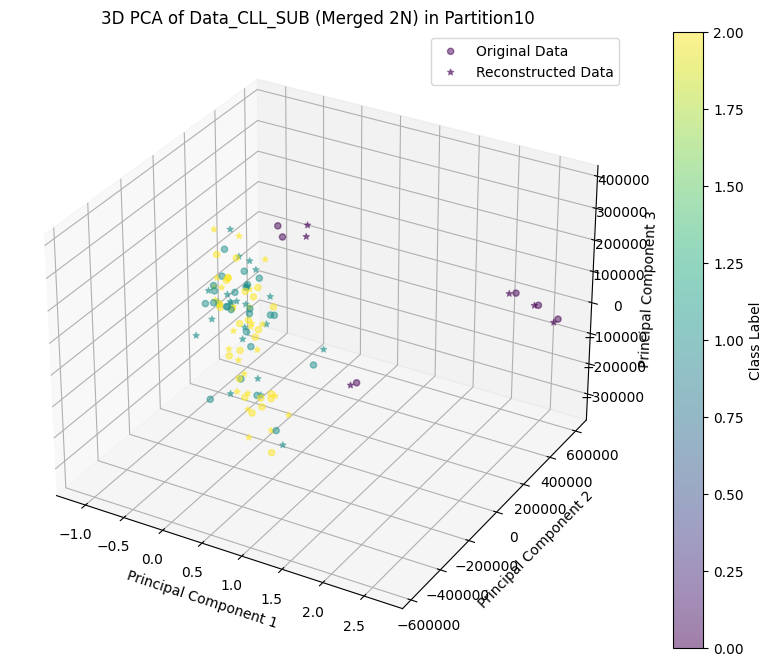

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition17/train_data.csv


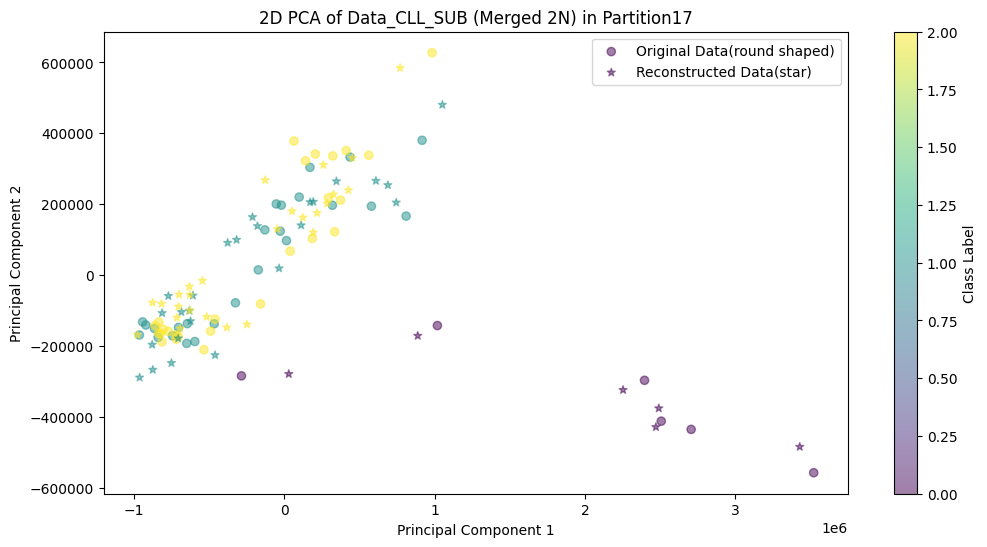

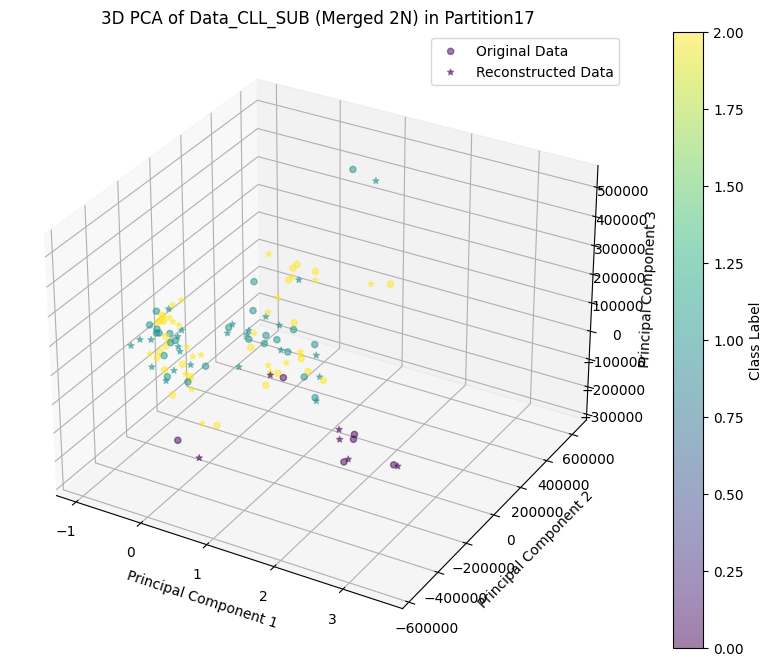

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition7/train_data.csv


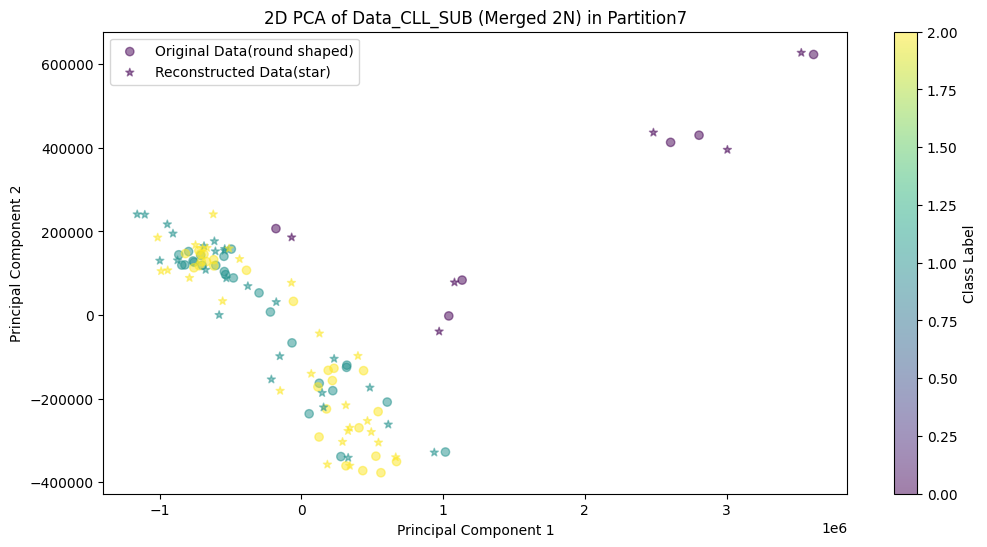

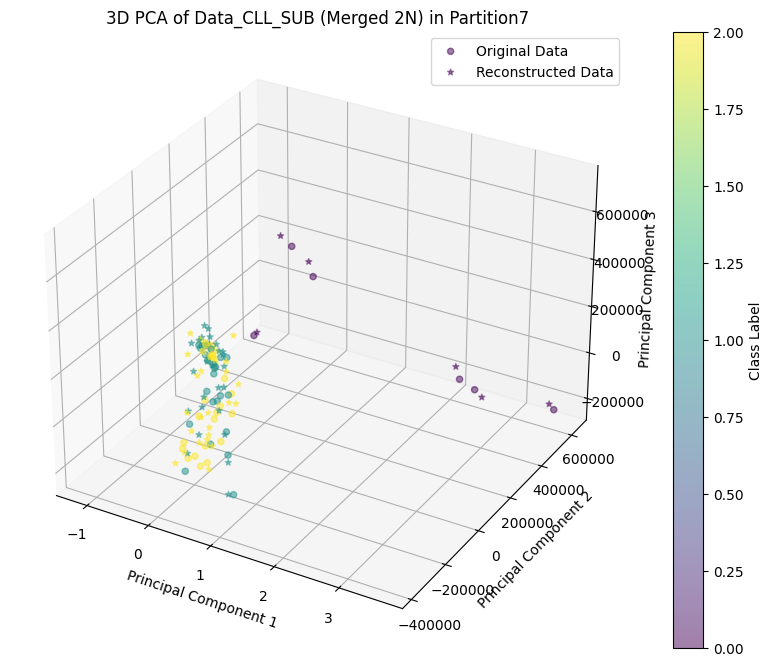

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition9/train_data.csv


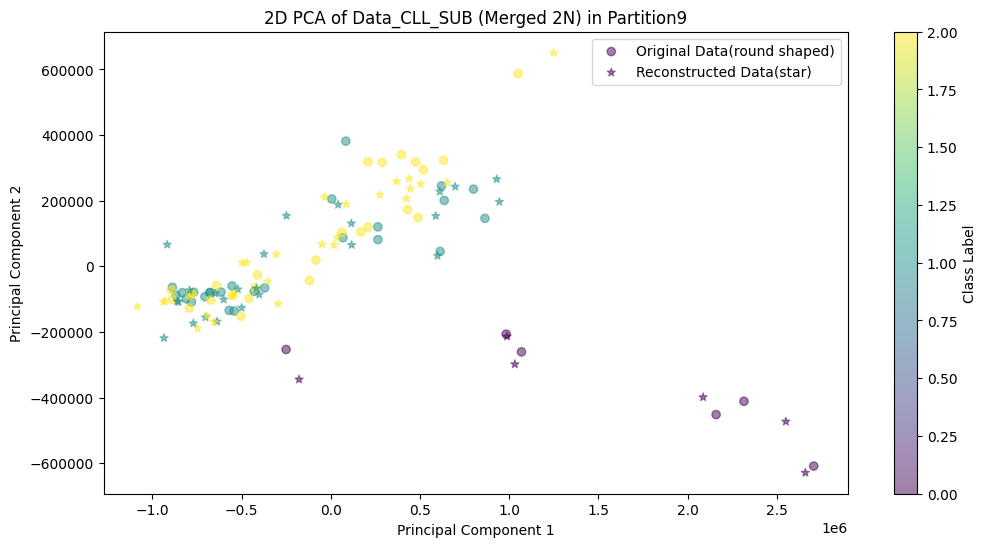

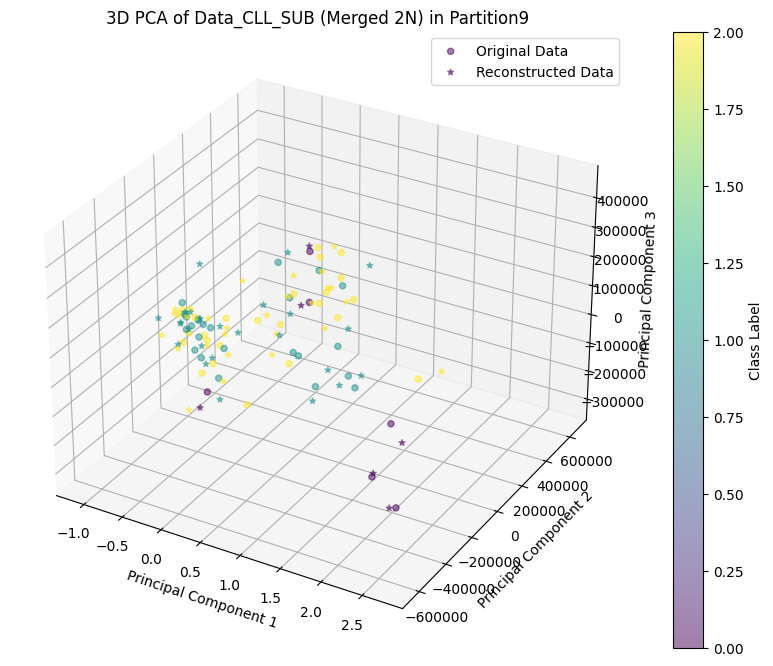

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition8/train_data.csv


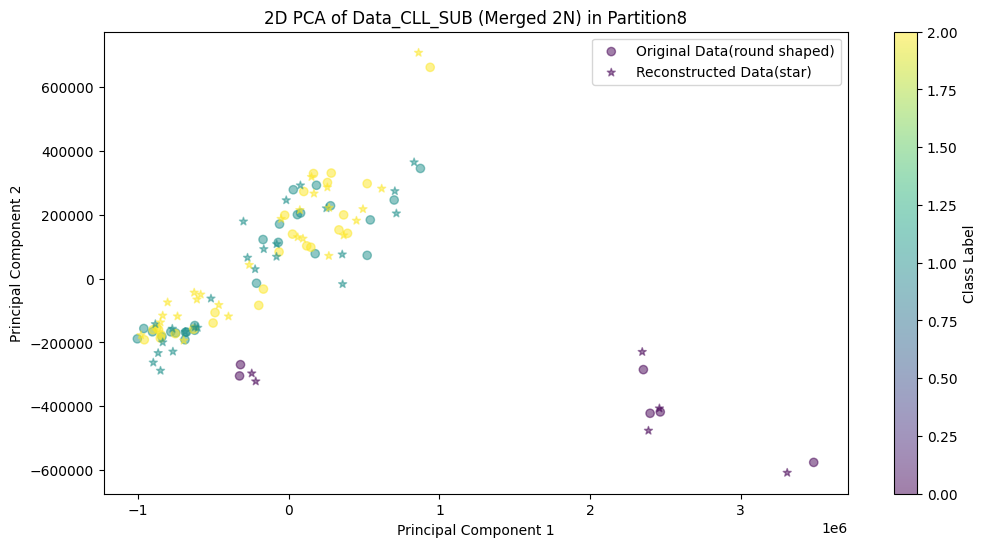

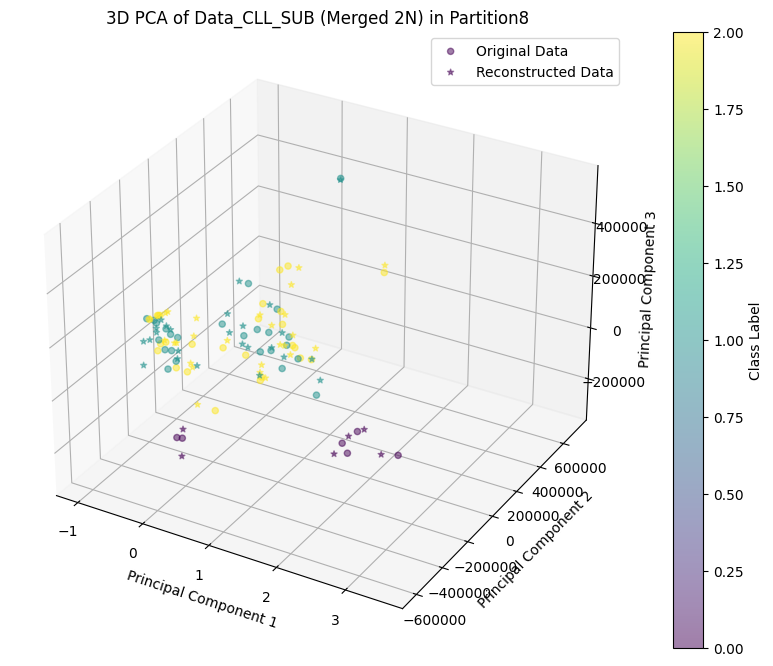

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition6/train_data.csv


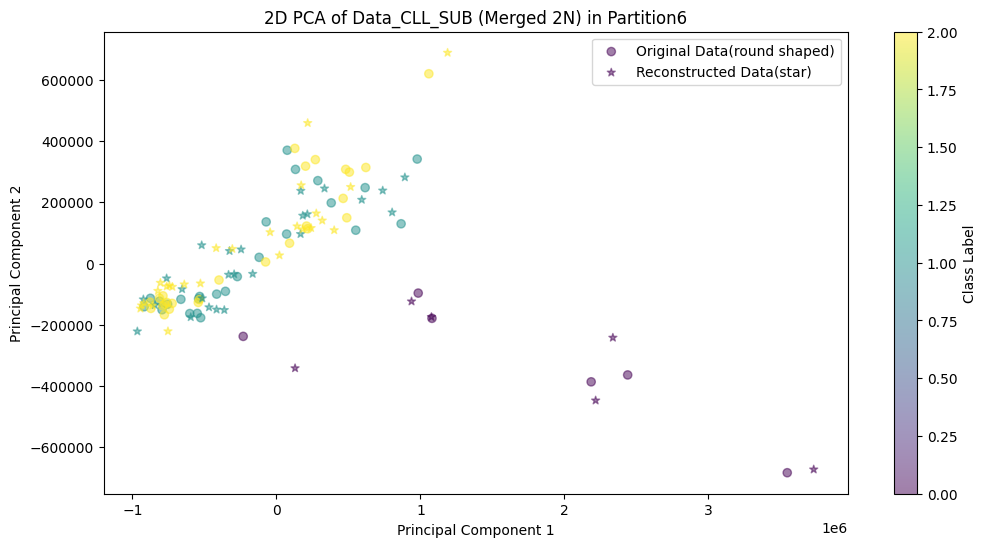

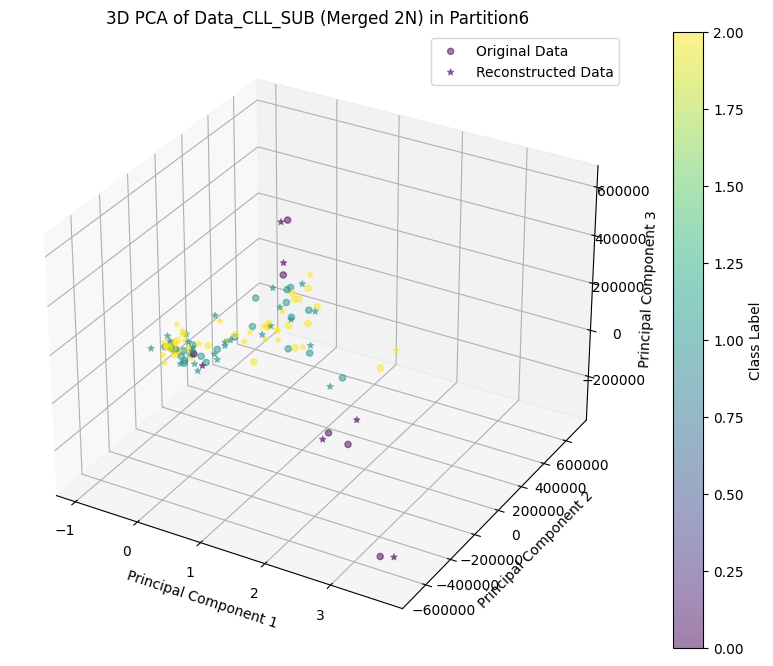

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition15/train_data.csv


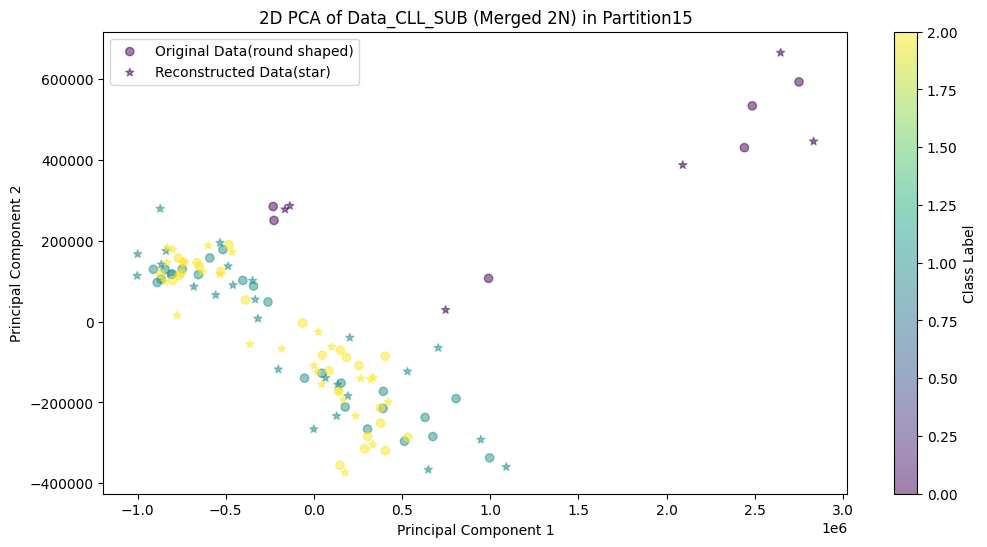

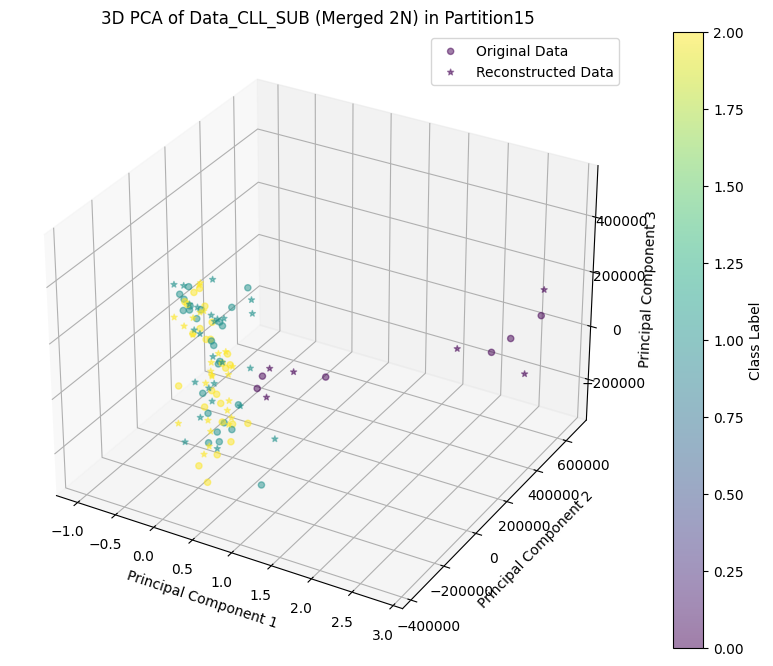

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition14/train_data.csv


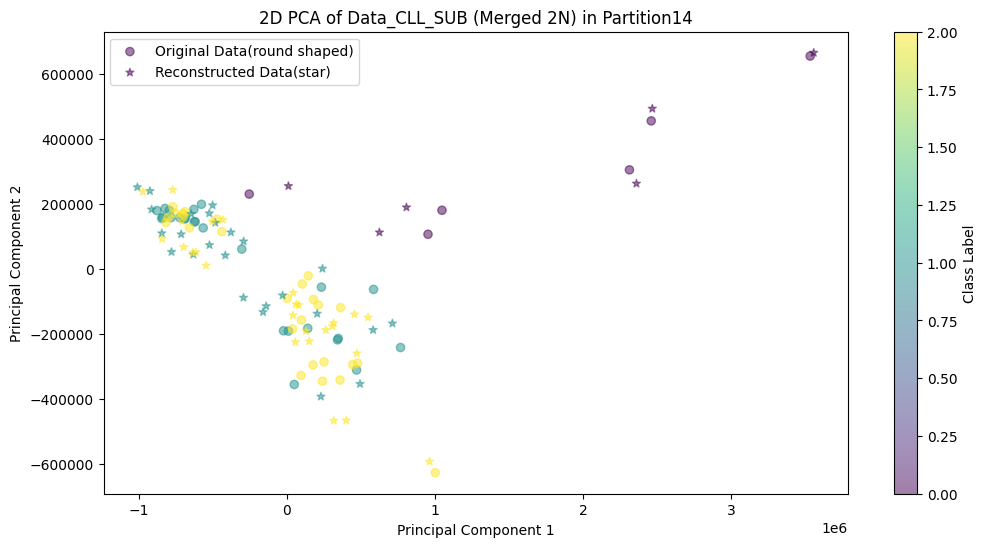

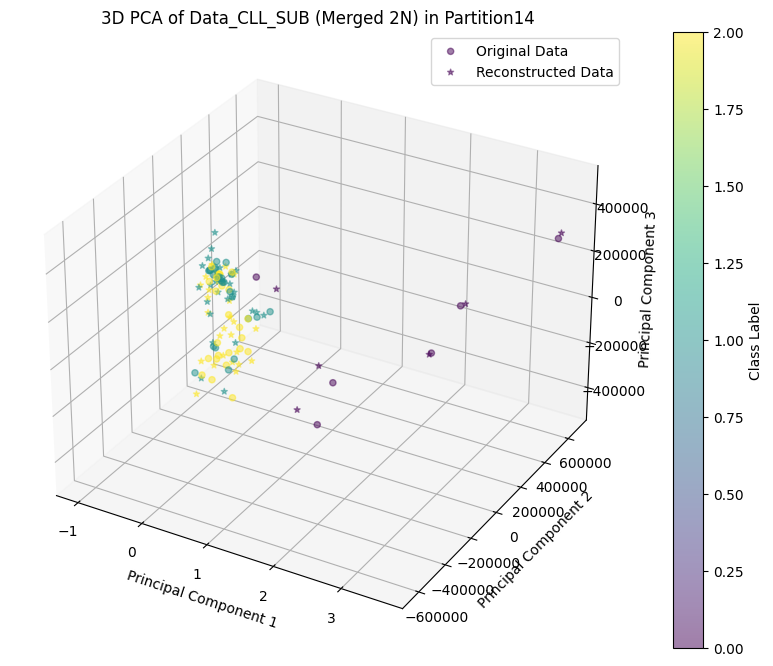

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition4/train_data.csv


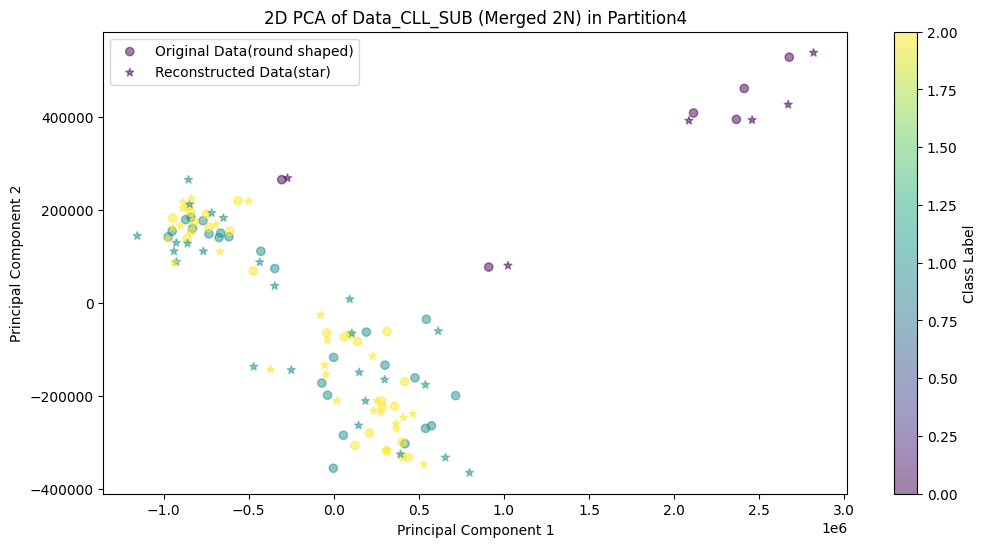

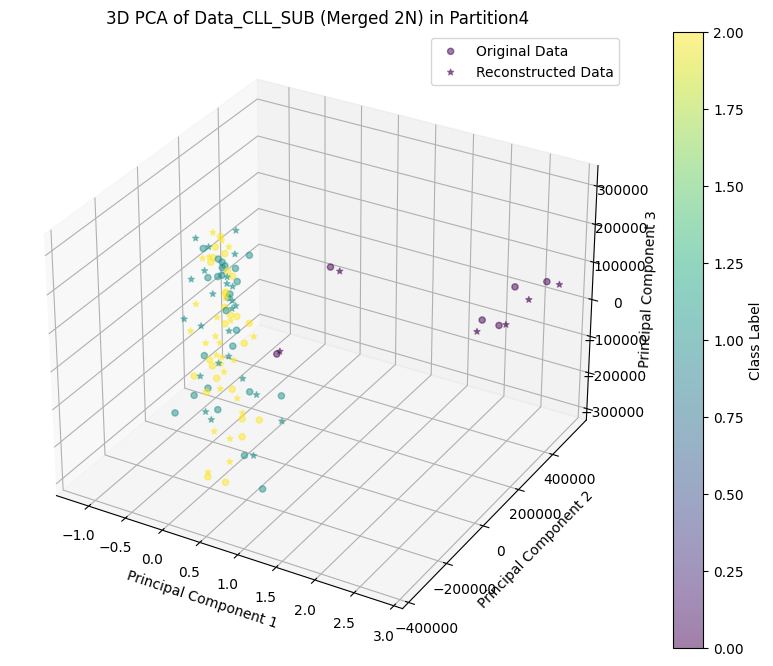

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition12/train_data.csv


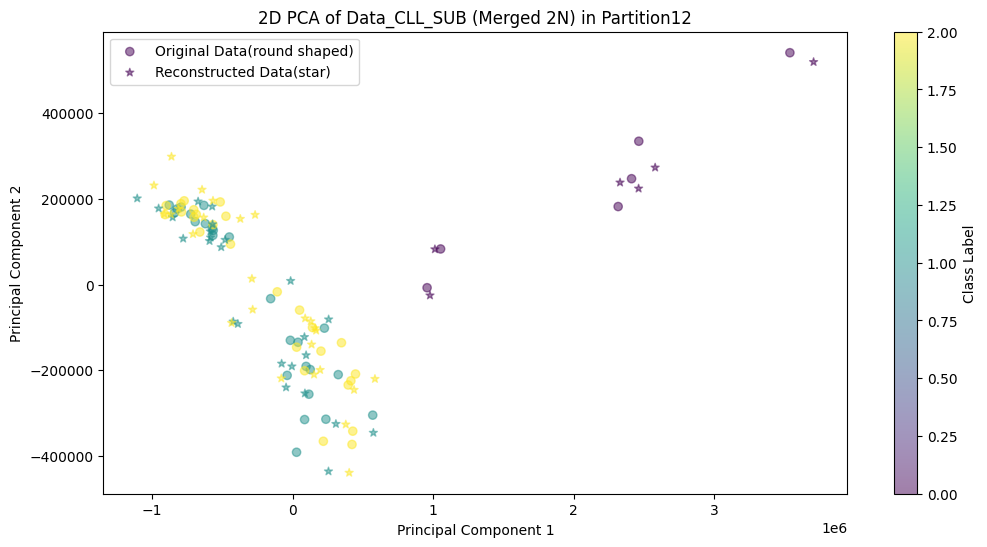

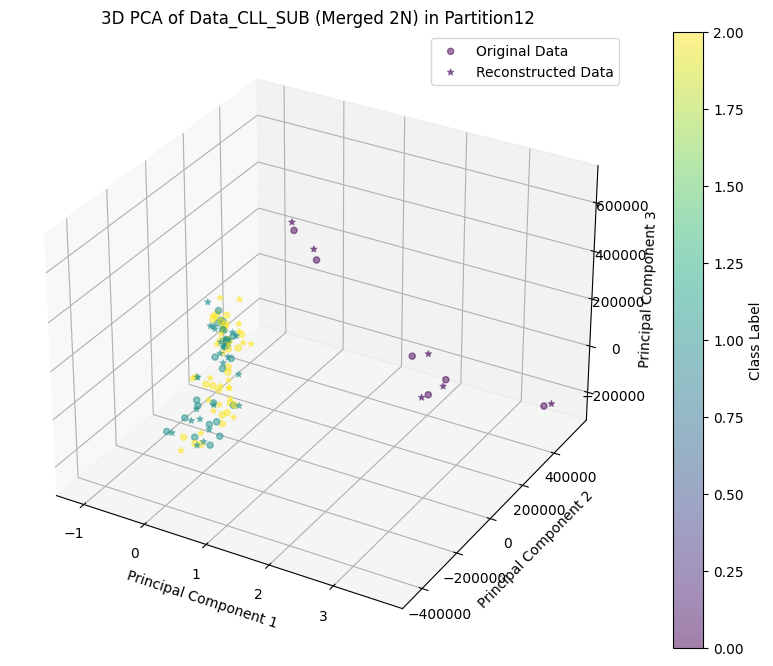

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition13/train_data.csv


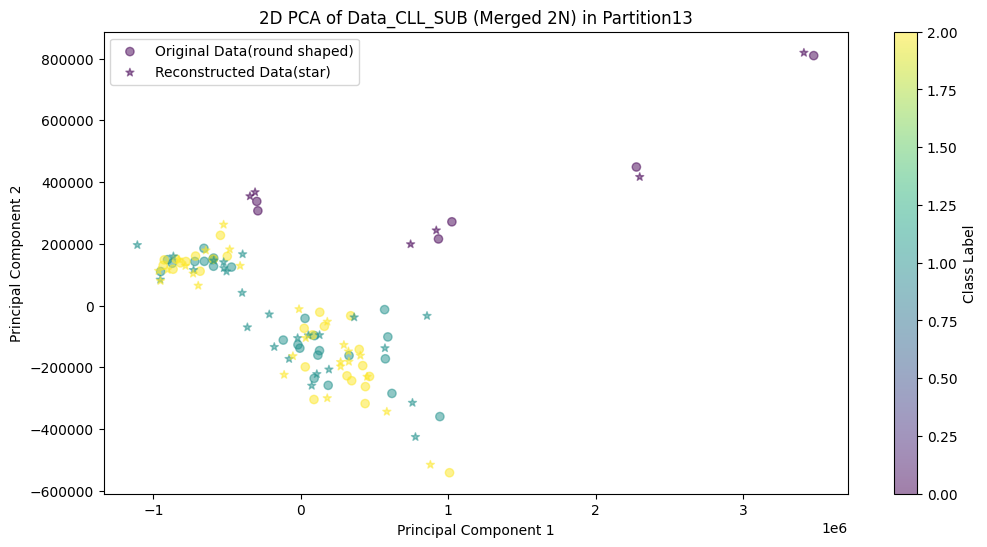

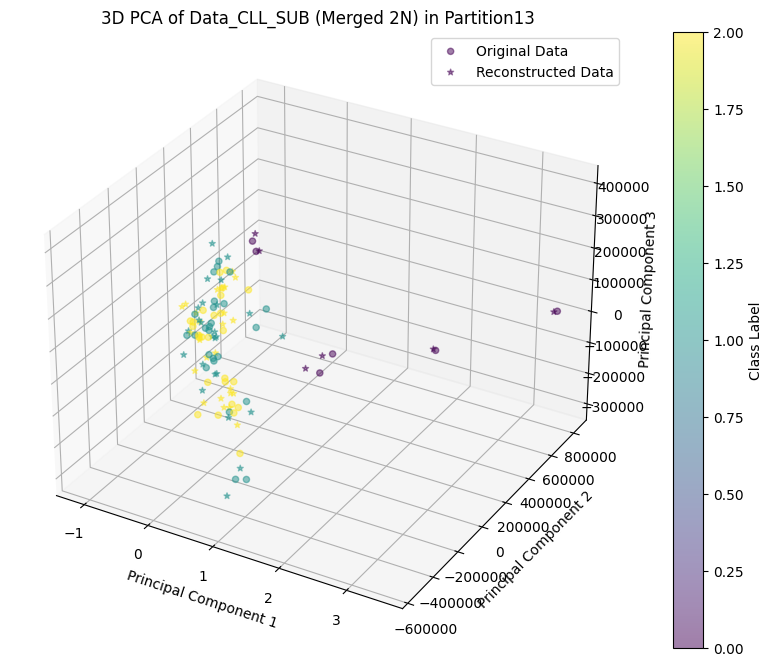

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition2/train_data.csv


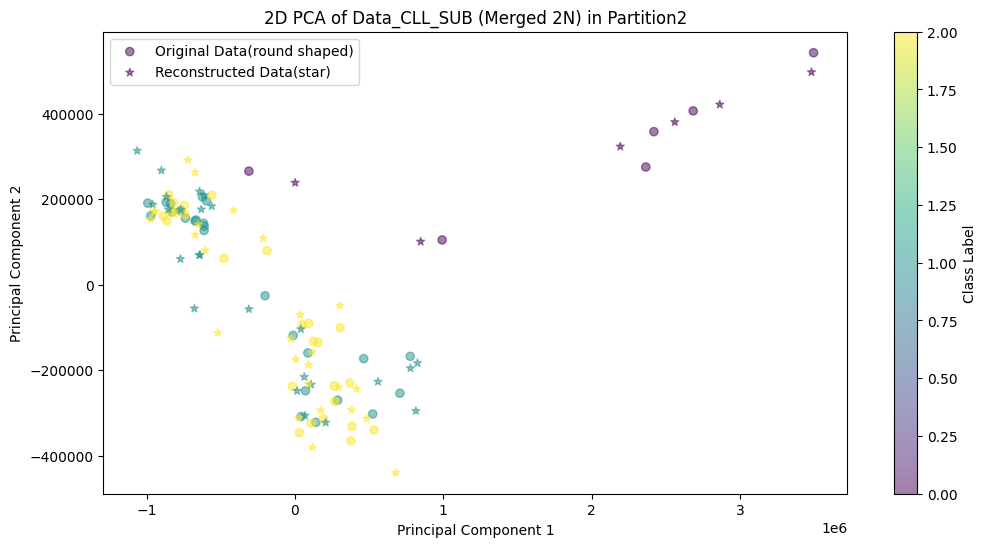

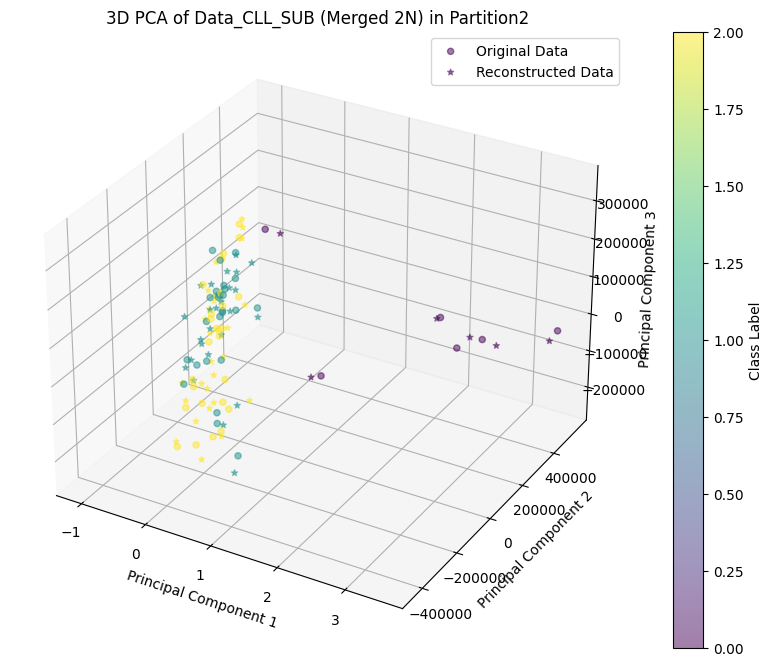

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition1/train_data.csv


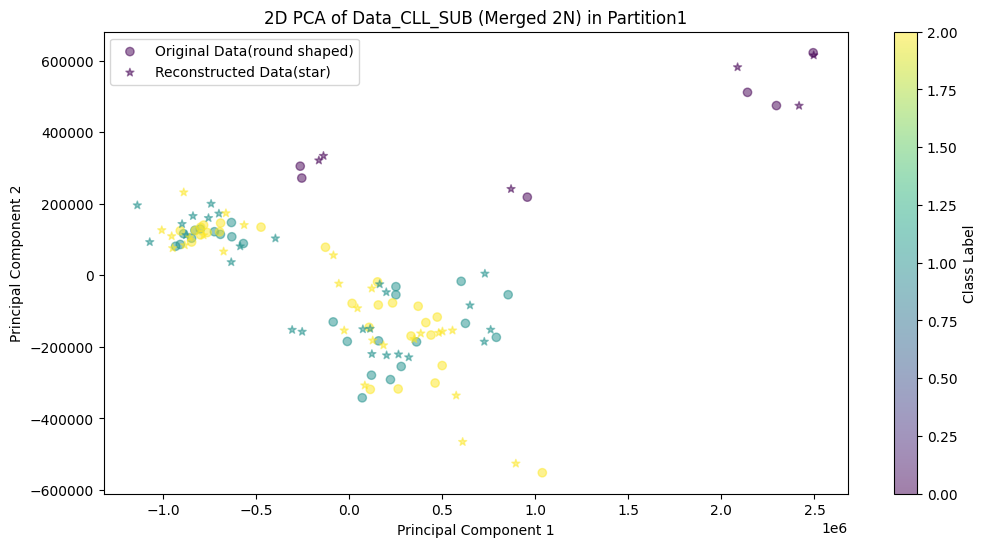

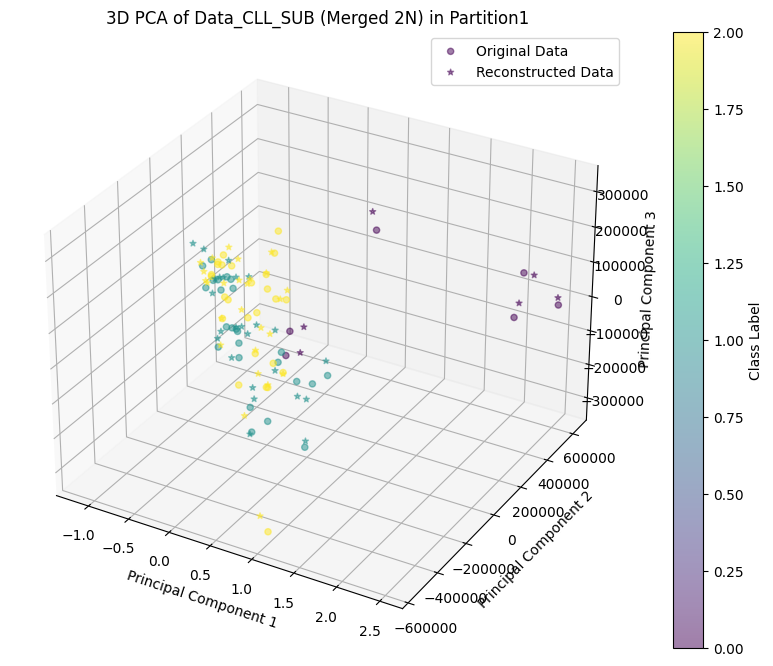

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition3/train_data.csv


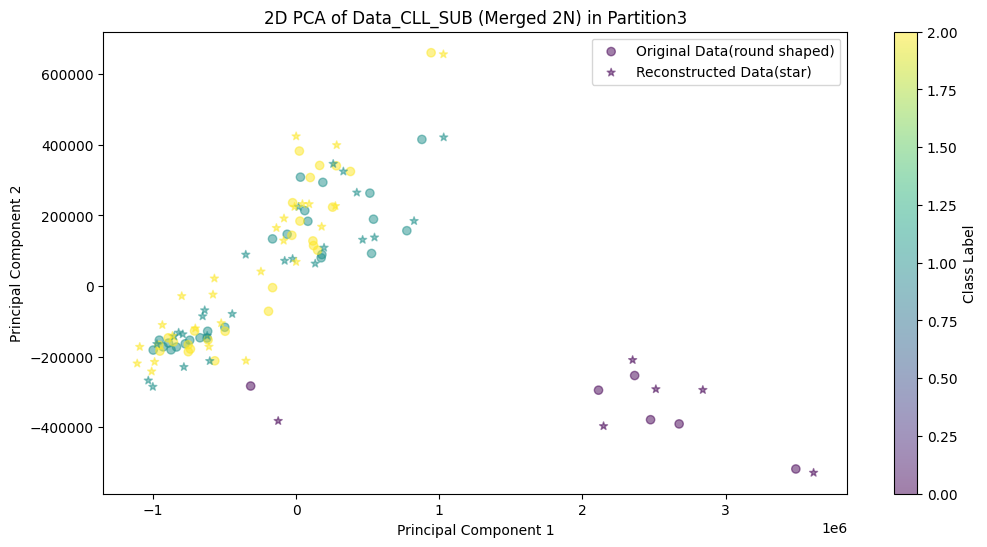

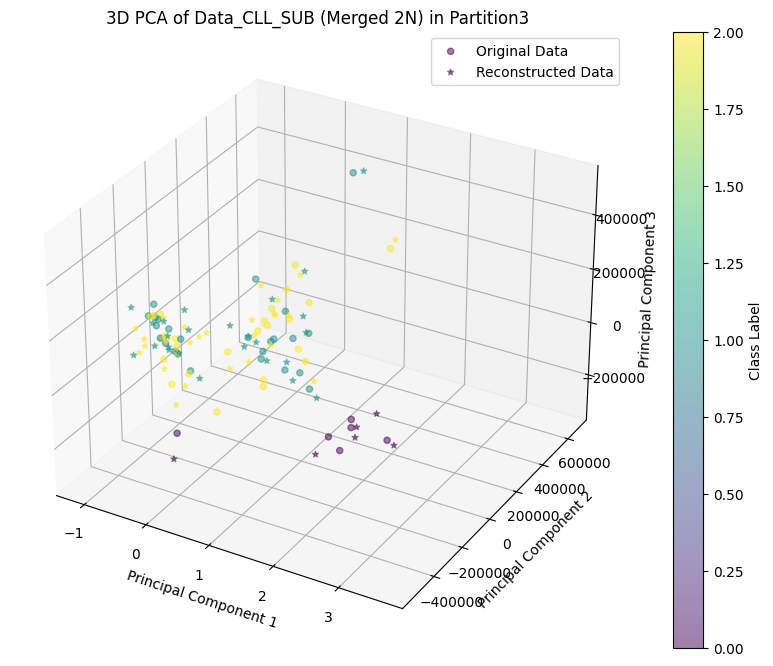

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition5/train_data.csv


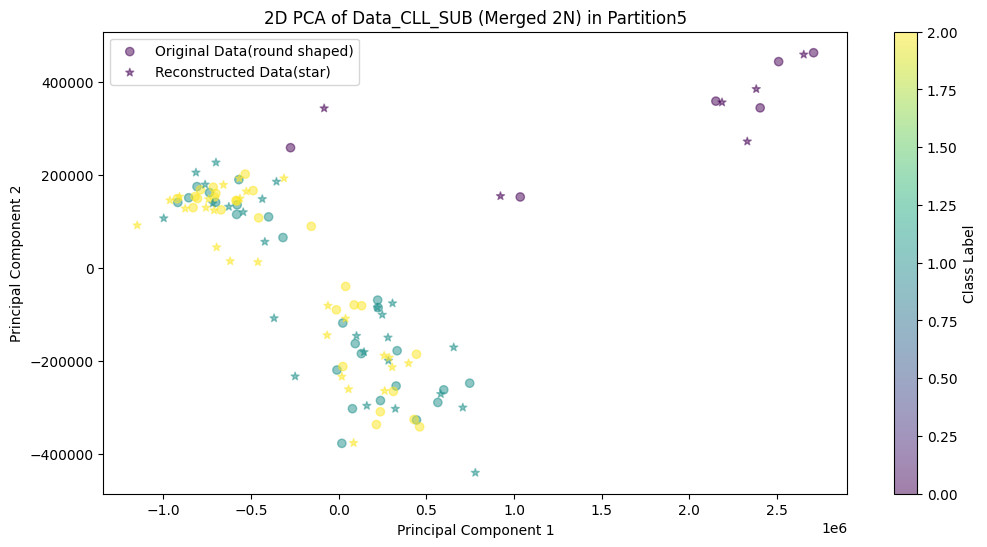

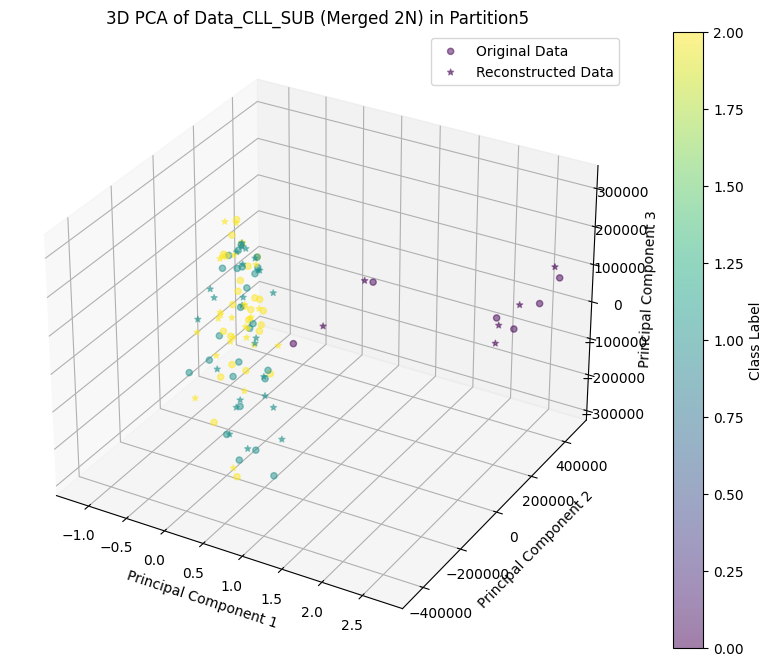

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from torch import nn, optim
from torch.nn import functional as F
import torch.utils.data as Data
from mpl_toolkits.mplot3d import Axes3D  # Import necessary for 3D plotting

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class VAE(nn.Module):
    def __init__(self, data_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(data_dim, 400)
        self.fc21 = nn.Linear(400, 20)  # Latent space dimension can be adjusted
        self.fc22 = nn.Linear(400, 20)
        self.fc3 = nn.Linear(20, 400)
        self.fc4 = nn.Linear(400, data_dim)

    def encode(self, x):
        h1 = F.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = F.relu(self.fc3(z))
        return self.fc4(h3)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    MSE = F.mse_loss(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return MSE + KLD

def process_data(file_path):
    data = np.loadtxt(file_path, delimiter=',', skiprows=1)
    X = data[:, :-1]  # Features
    y = data[:, -1]   # Labels
    data_dim = X.shape[1]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    model = VAE(data_dim).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    tensor_data = torch.tensor(X_scaled, dtype=torch.float32).to(device)
    data_loader = Data.DataLoader(tensor_data, batch_size=256, shuffle=True)

    model.train()
    for epoch in range(50):
        for data in data_loader:
            optimizer.zero_grad()
            reconstructed, mu, logvar = model(data)
            loss = loss_function(reconstructed, data, mu, logvar)
            loss.backward()
            optimizer.step()

    model.eval()
    with torch.no_grad():
        reconstructed, _, _ = model(tensor_data)
        reconstructed = reconstructed.cpu().numpy()

    original_data = scaler.inverse_transform(X_scaled)
    reconstructed_data = scaler.inverse_transform(reconstructed)

    combined_data = np.vstack((original_data, reconstructed_data))
    combined_labels = np.concatenate((y, y))
    output_array = np.hstack((combined_data, combined_labels.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'combined_train_2n.csv'), output_array, delimiter=',')

    # Save only the reconstructed data as augmented_n.csv
    augmented_data = np.hstack((reconstructed_data, y.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'augmented_n.csv'), augmented_data, delimiter=',')

    df_tensor = torch.from_numpy(combined_data).float()
    df_tensor = df_tensor.to(device)

    x = df_tensor[:, :-1]
    y = df_tensor[:, -1].int()



    x = df_tensor[:, :-1].cpu().numpy()  # Convert to NumPy array and ensure it's on CPU for sklearn
    y = df_tensor[:, -1].int()
    from sklearn.decomposition import PCA
    # Apply PCA using sklearn
    pca = PCA(n_components=3)
    combined_data_pca = pca.fit_transform(x)

    # 2D PCA Plot
    plt.figure(figsize=(12, 6))
    plt.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                c=combined_labels[:len(original_data)], marker='o', label='Original Data(round shaped)', alpha=0.5, cmap='viridis')
    plt.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
                c=combined_labels[len(original_data):], marker='*', label='Reconstructed Data(star)', alpha=0.5, cmap='viridis')
    plt.title(f'2D PCA of Data_CLL_SUB (Merged 2N) in {os.path.basename(os.path.dirname(file_path))}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Class Label')
    plt.legend()
    plt.show()

    # 3D PCA Plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                         combined_data_pca[:len(original_data), 2], c=combined_labels[:len(original_data)],
                         marker='o', label='Original Data', alpha=0.5, cmap='viridis')
    ax.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
               combined_data_pca[len(original_data):, 2], c=combined_labels[len(original_data):],
               marker='*', label='Reconstructed Data', alpha=0.5, cmap='viridis')
    ax.set_title(f'3D PCA of Data_CLL_SUB (Merged 2N) in {os.path.basename(os.path.dirname(file_path))}')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    fig.colorbar(scatter, ax=ax, label='Class Label')
    ax.legend()
    plt.show()

root_dir = '/content/drive/MyDrive/Data/CLL_SUB'

for subdir, dirs, files in os.walk(root_dir):
    for file in files:
        if file.endswith('train_data.csv'):
            file_path = os.path.join(subdir, file)
            print(f"Processing {file_path}")
            process_data(file_path)


Processing /content/drive/MyDrive/Data/CLL_SUB/Partition18/combined_train_2n.csv


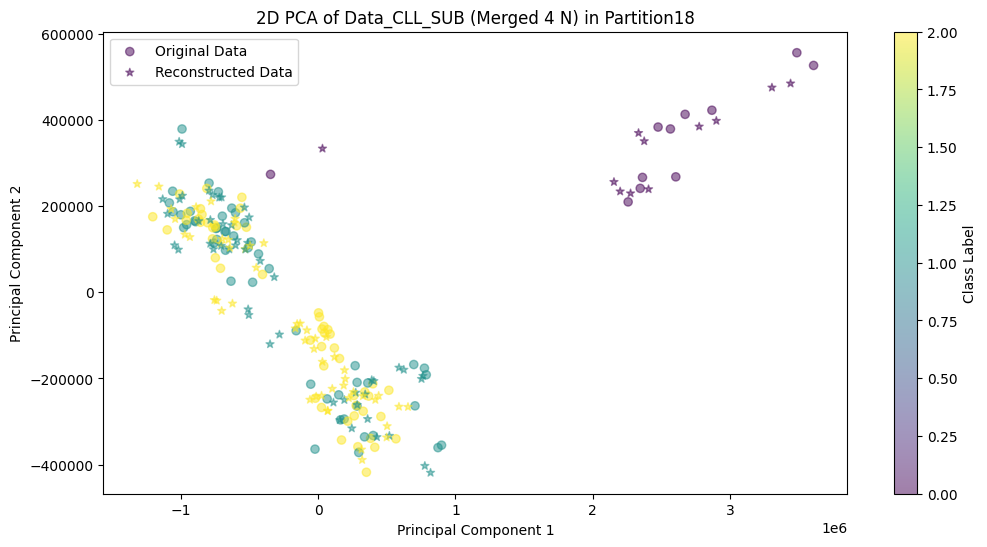

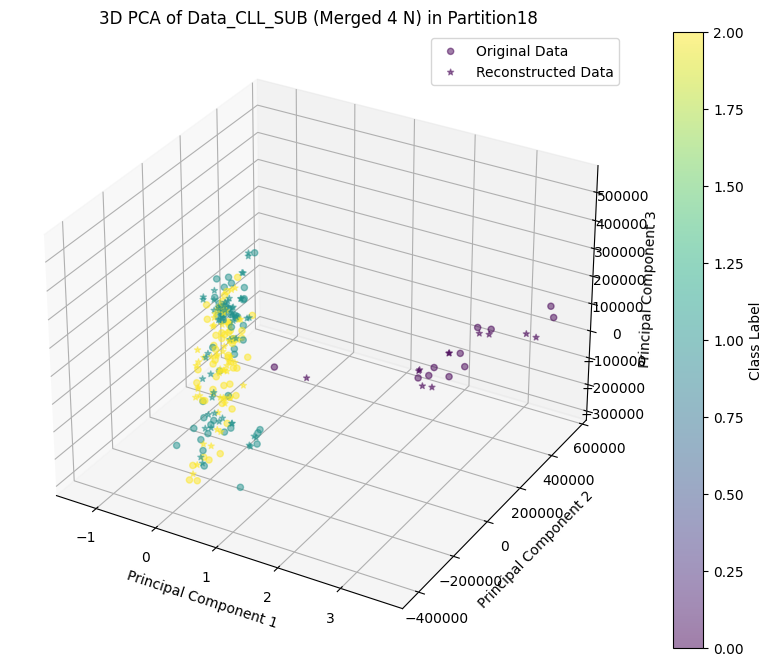

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition0/combined_train_2n.csv


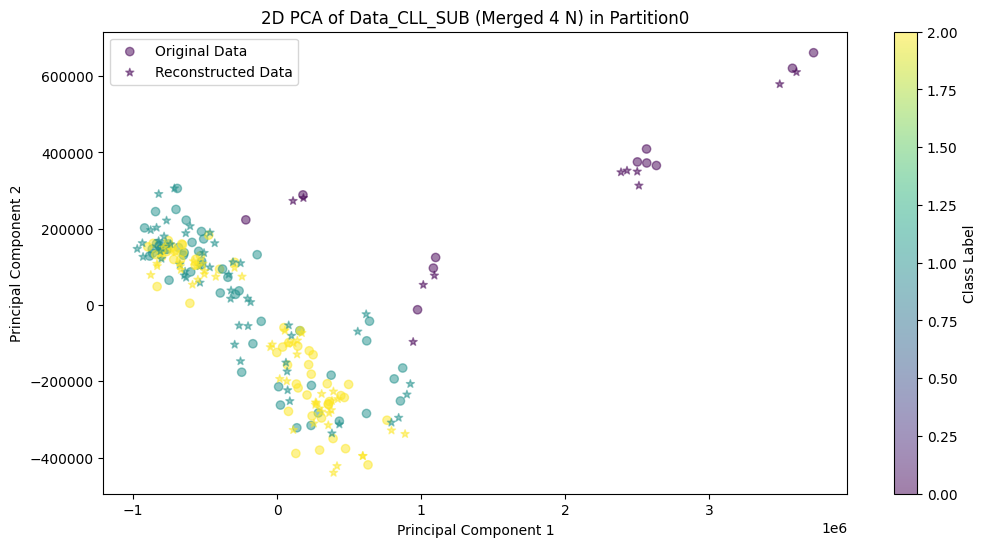

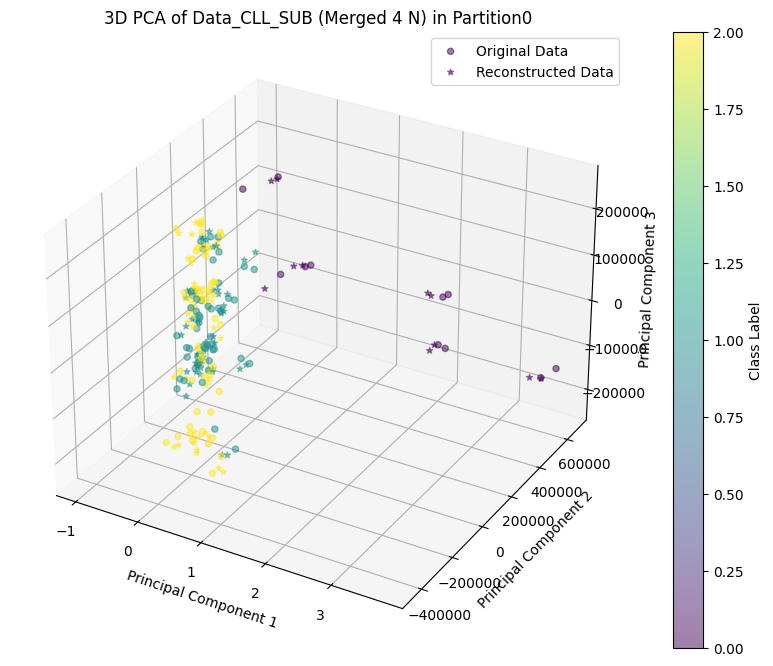

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition11/combined_train_2n.csv


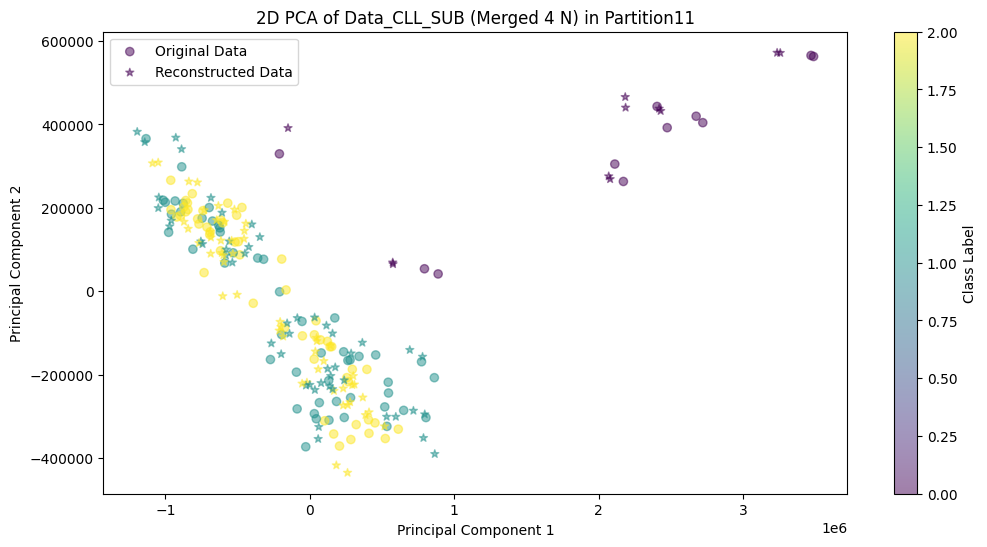

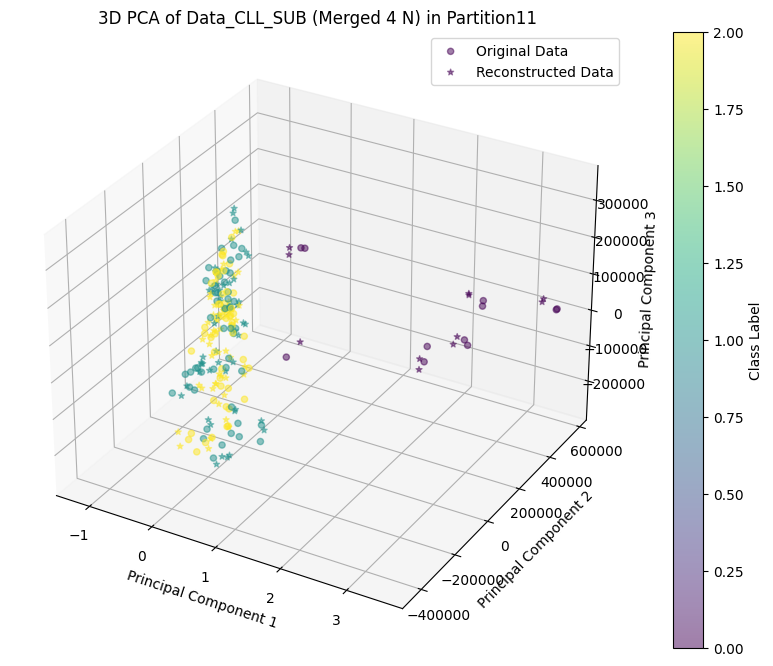

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition16/combined_train_2n.csv


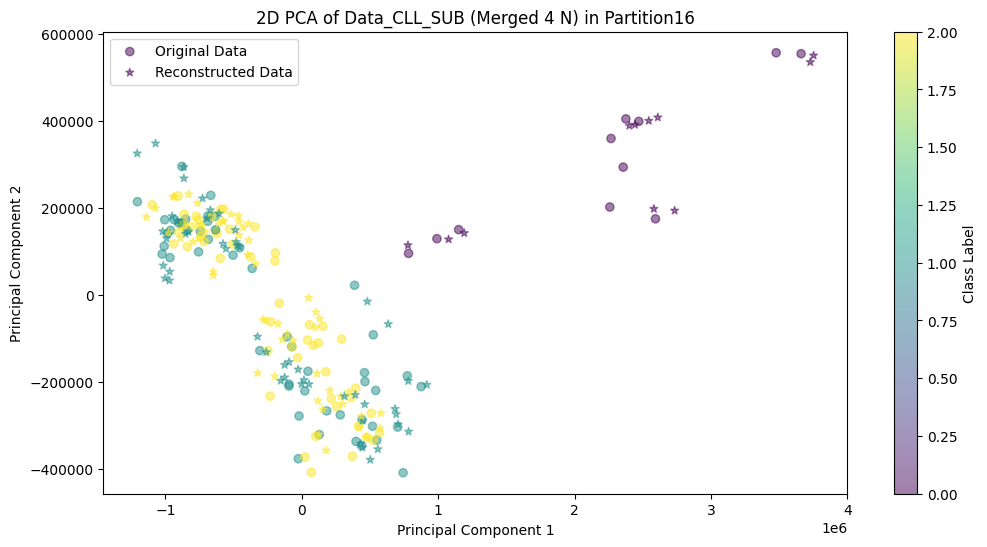

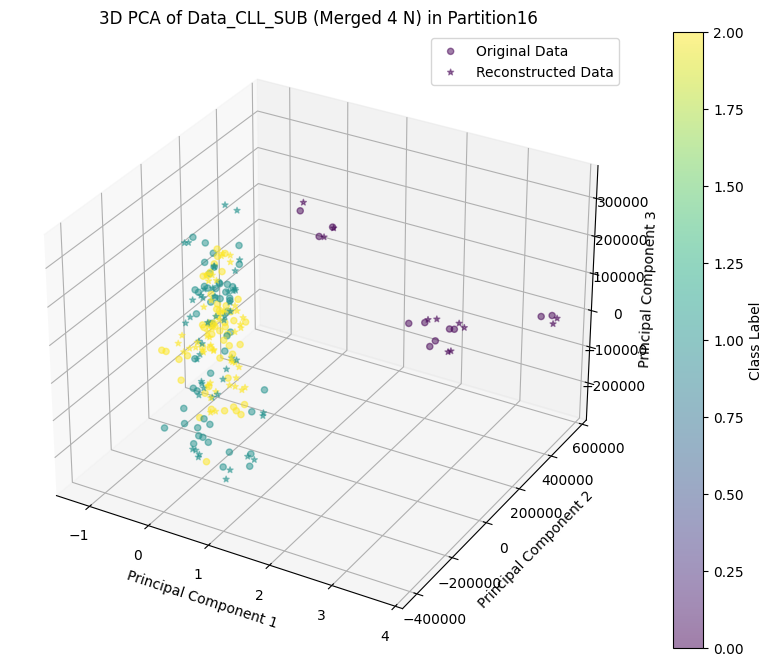

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition10/combined_train_2n.csv


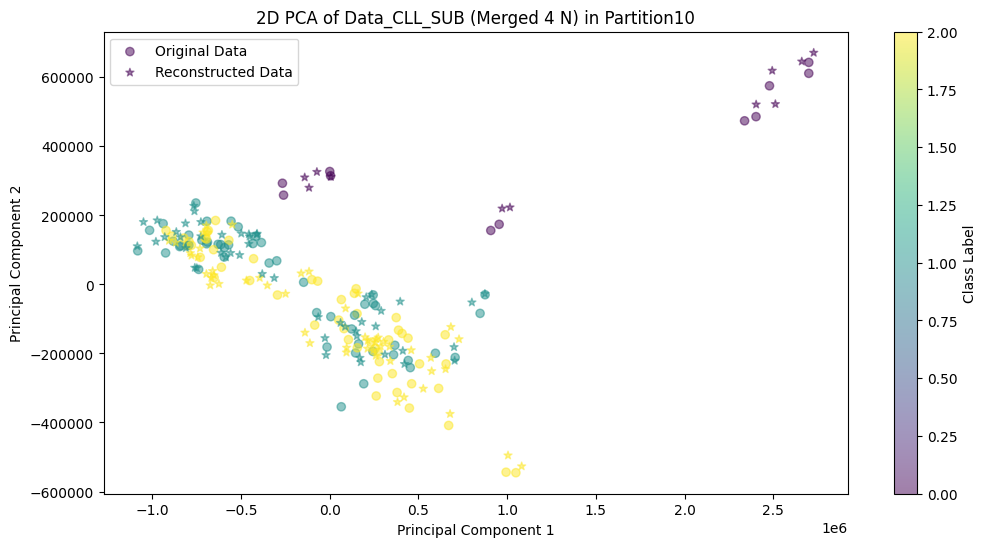

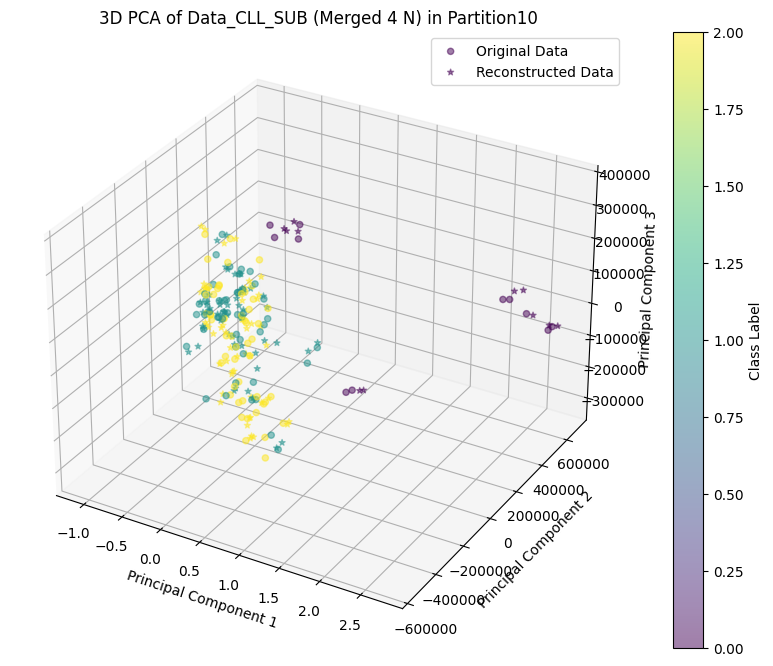

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition17/combined_train_2n.csv


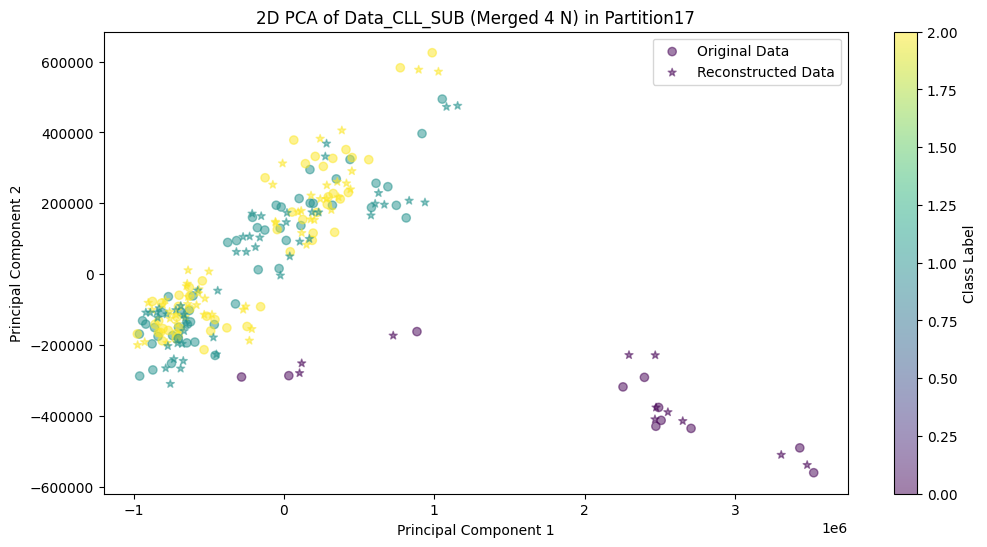

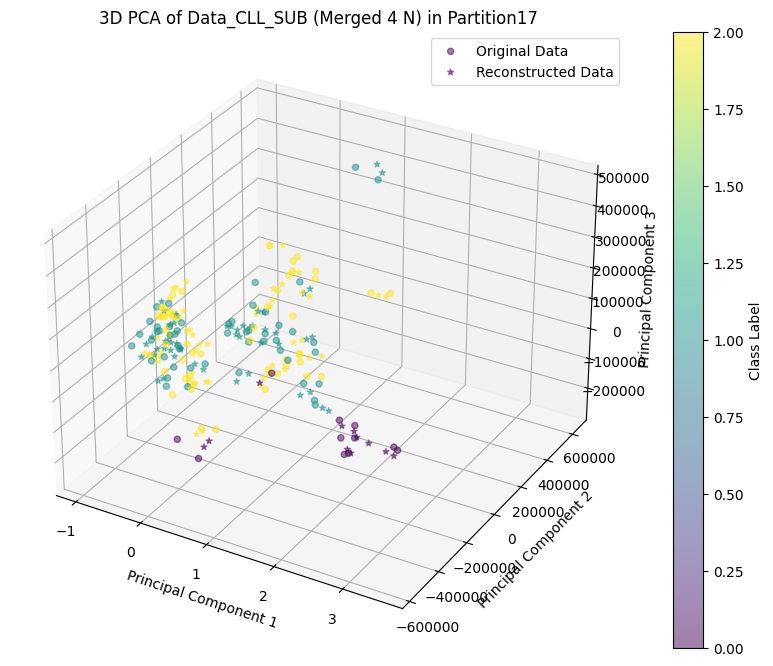

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition7/combined_train_2n.csv


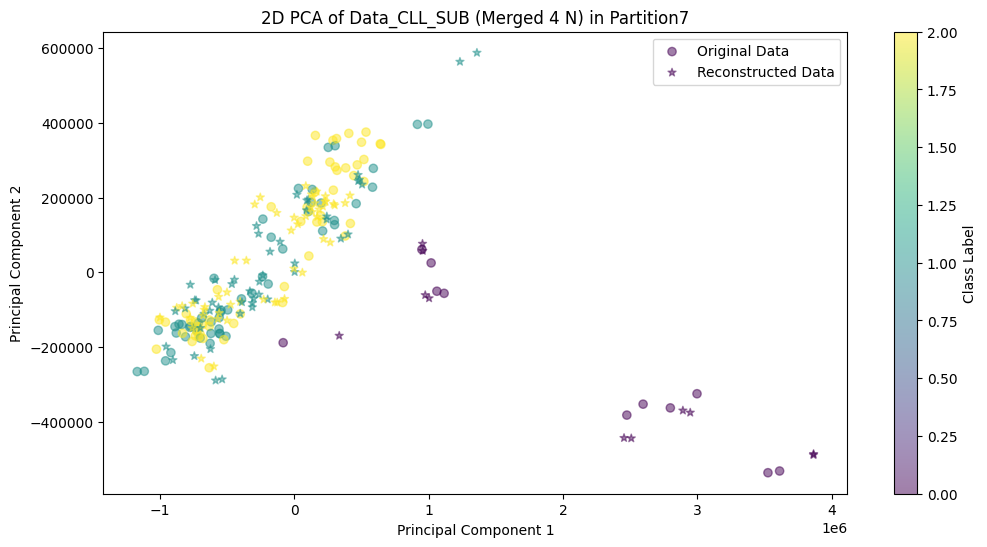

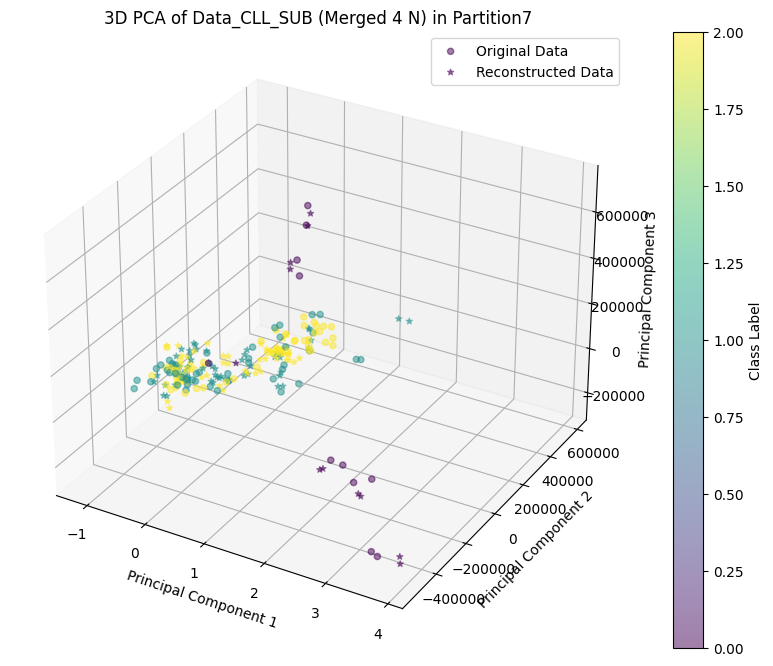

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition9/combined_train_2n.csv


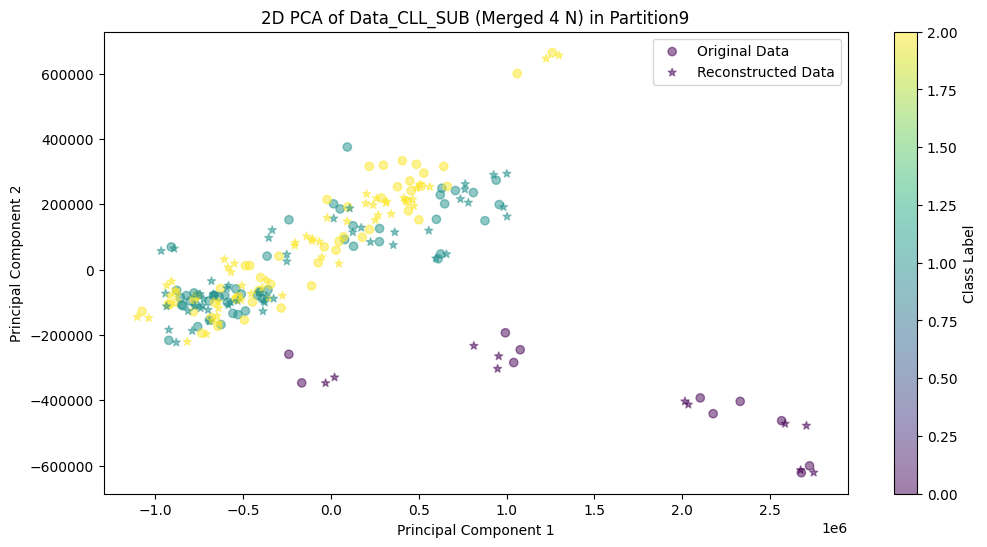

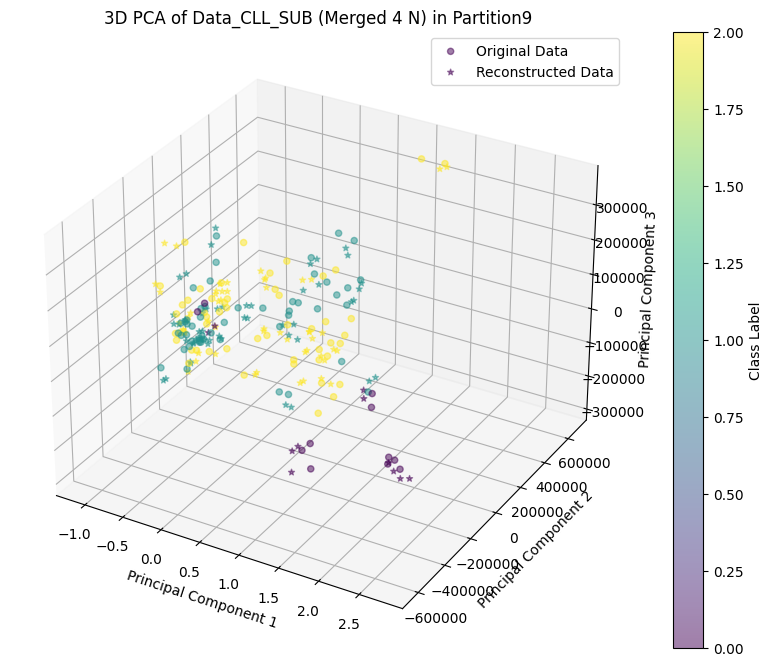

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition8/combined_train_2n.csv


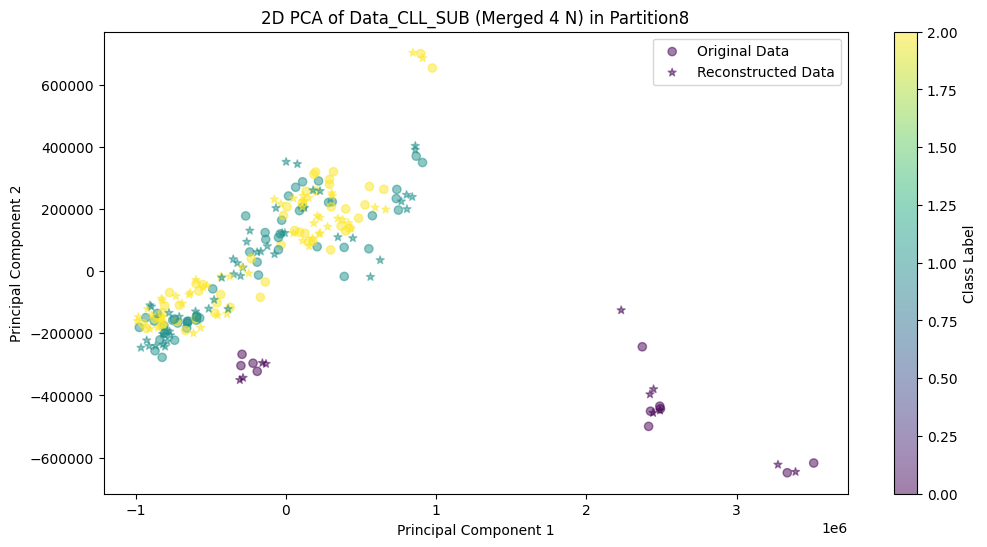

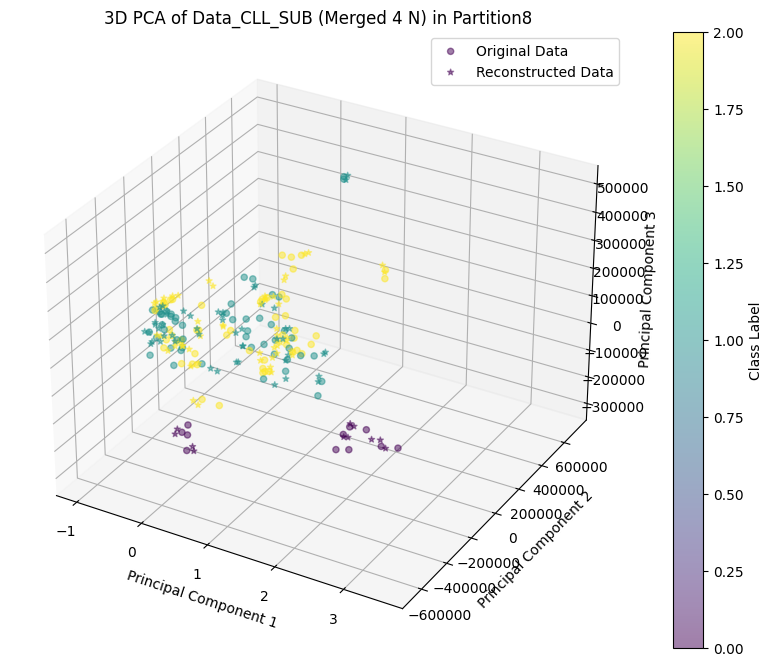

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition6/combined_train_2n.csv


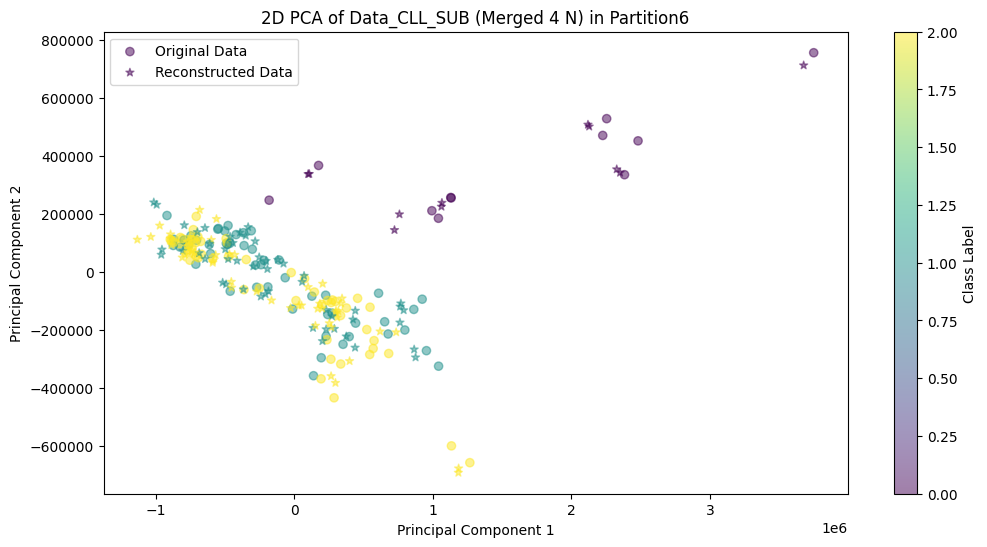

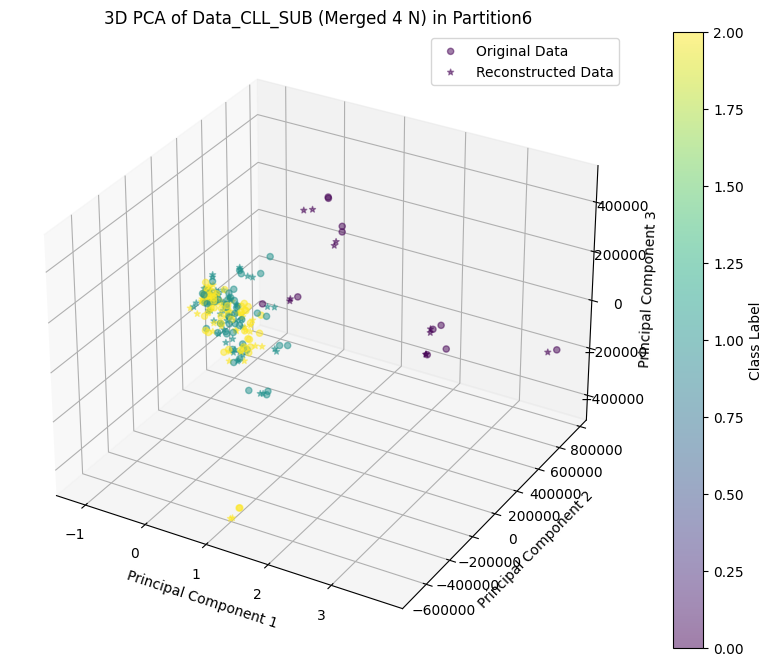

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition15/combined_train_2n.csv


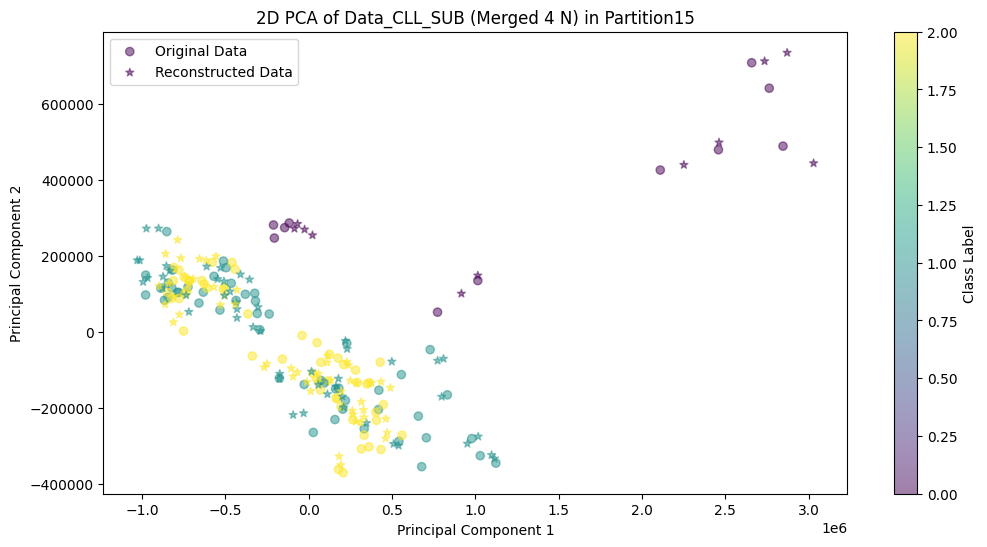

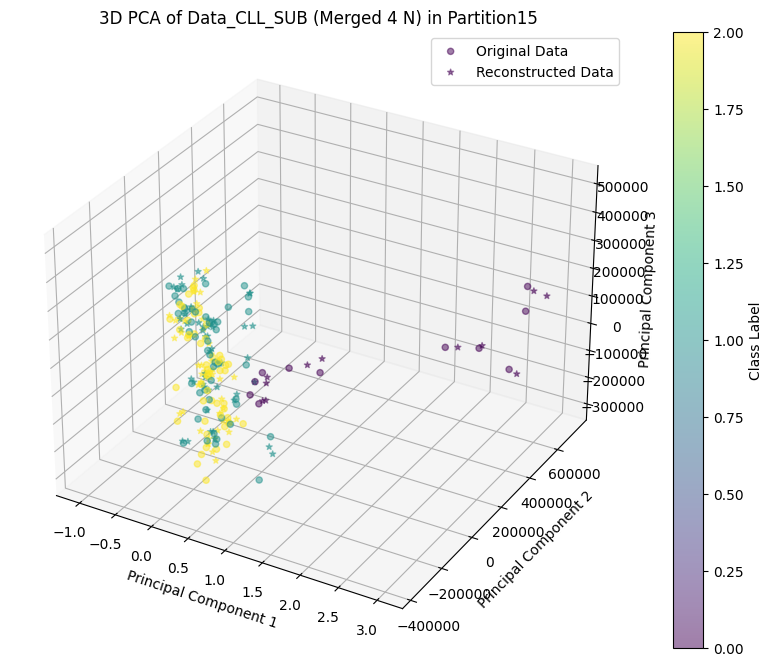

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition14/combined_train_2n.csv


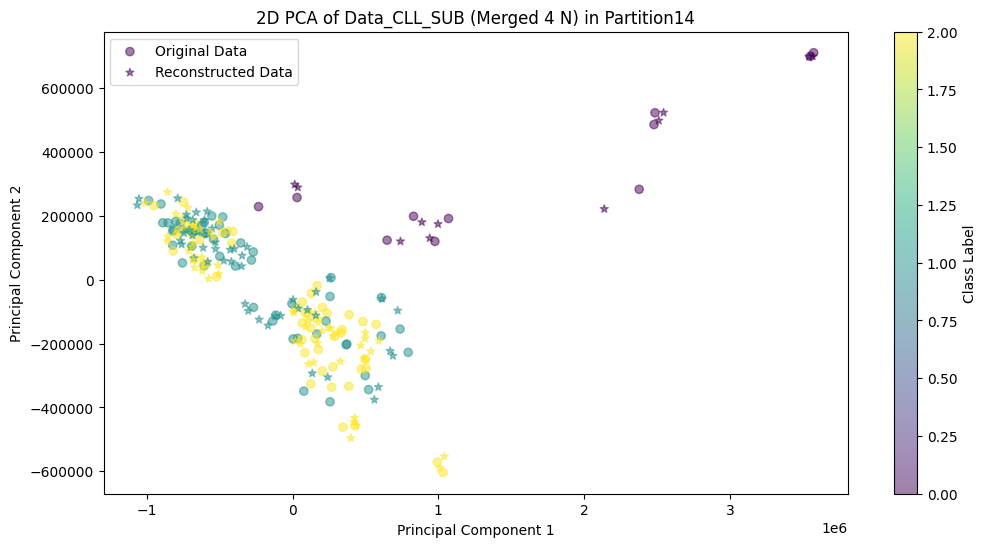

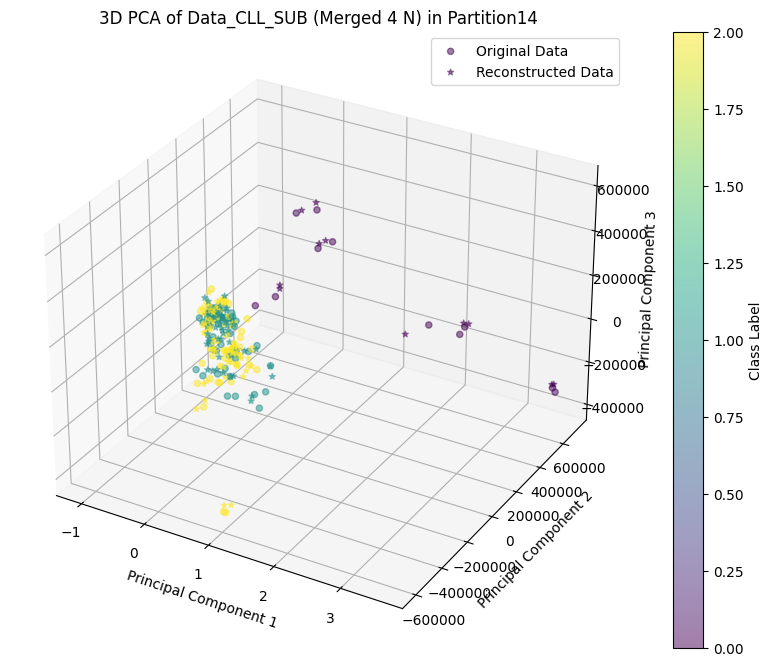

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition4/combined_train_2n.csv


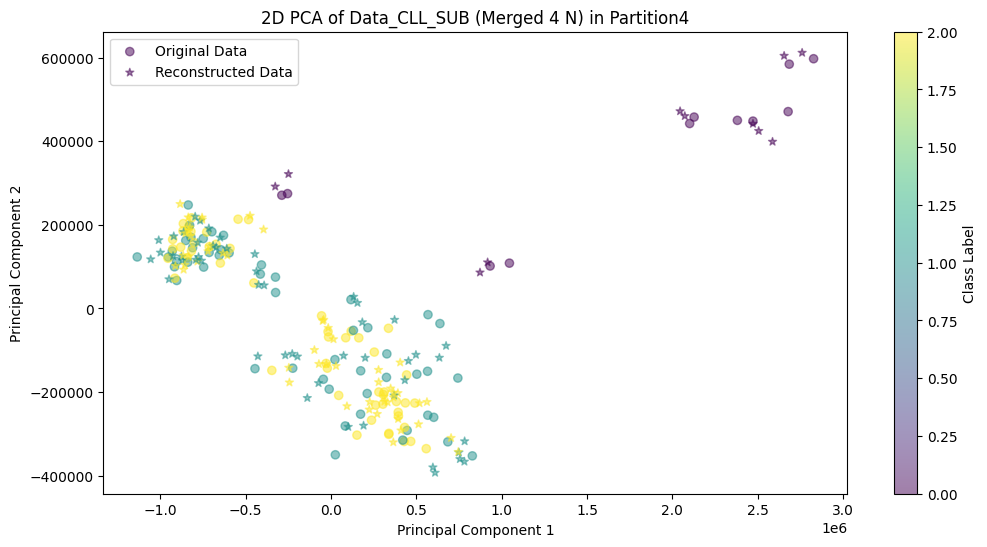

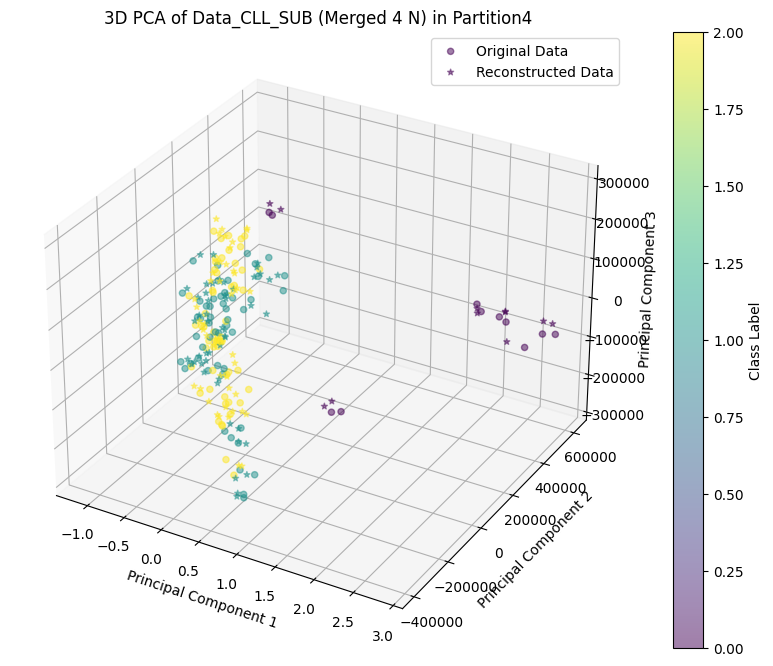

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition12/combined_train_2n.csv


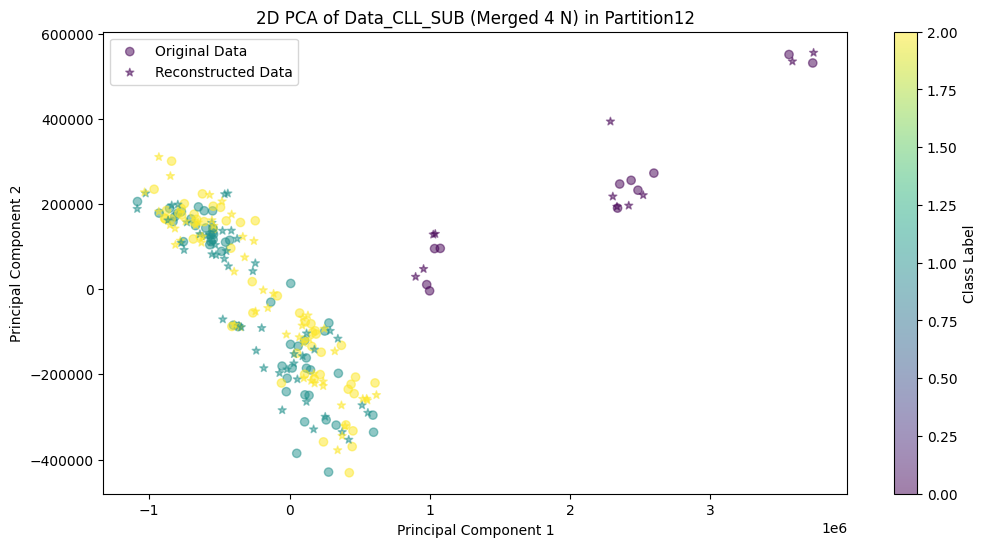

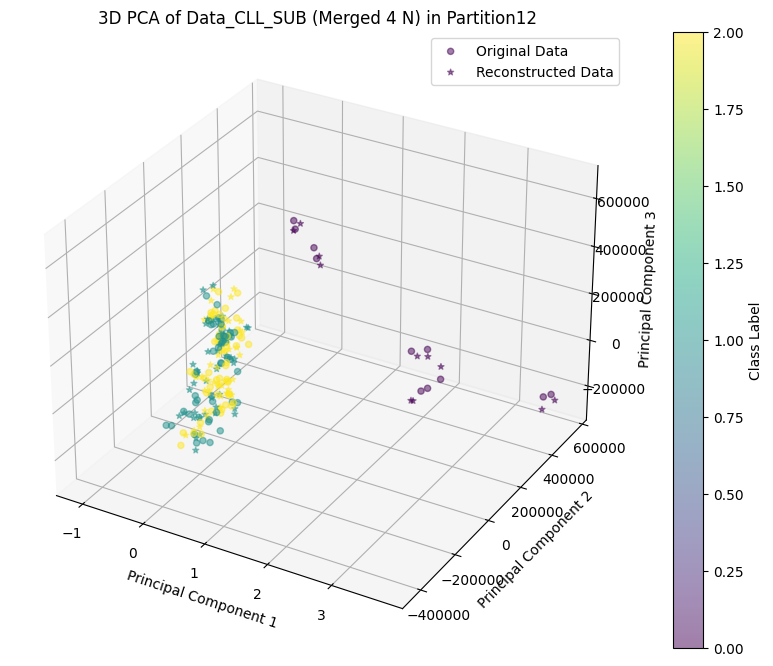

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition13/combined_train_2n.csv


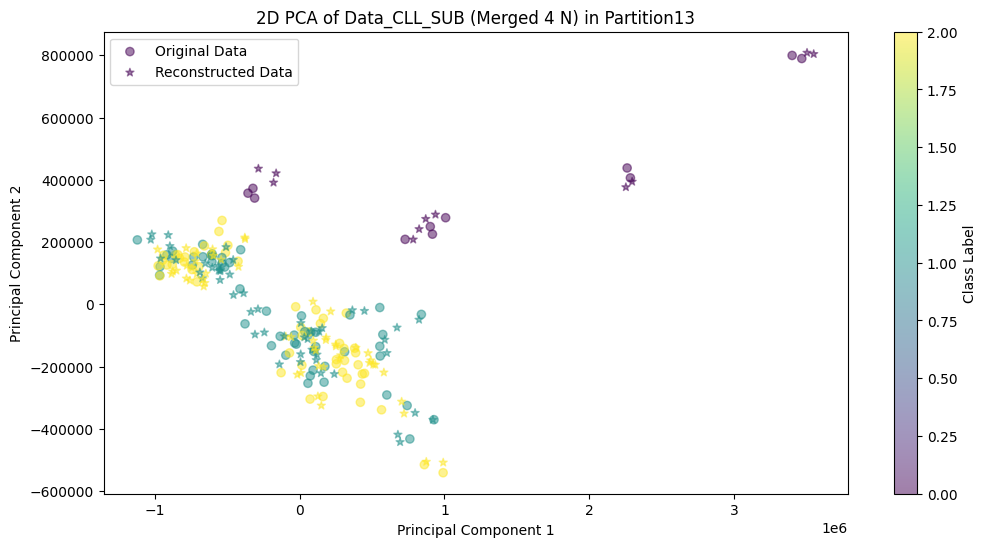

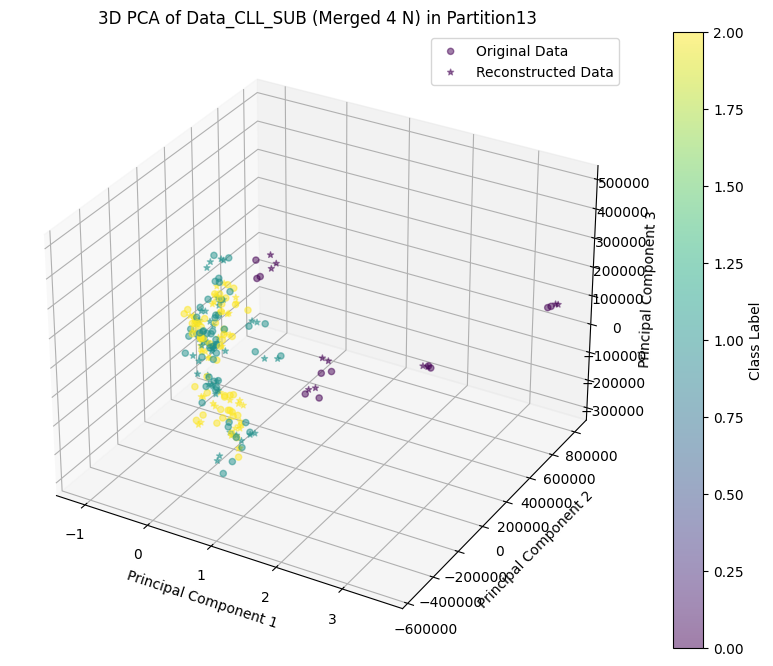

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition2/combined_train_2n.csv


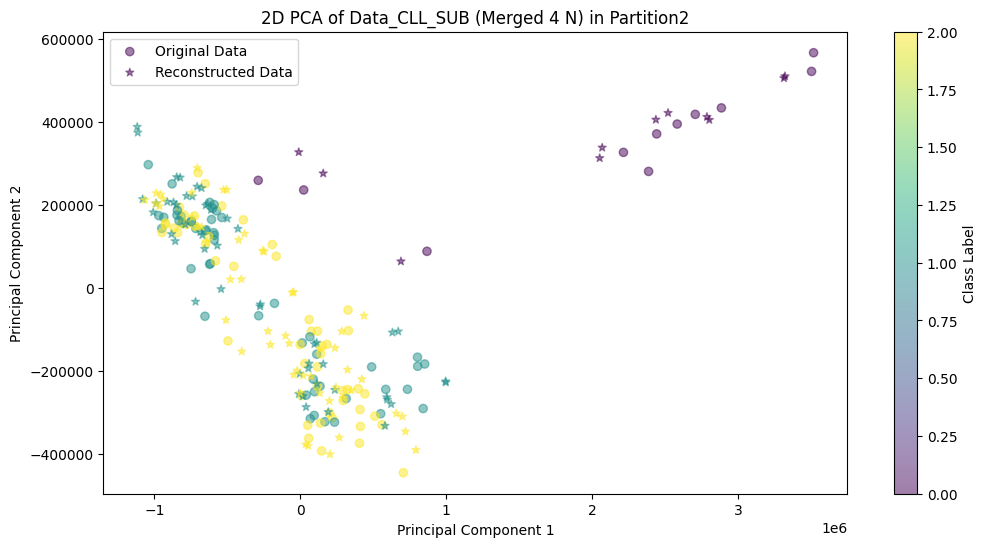

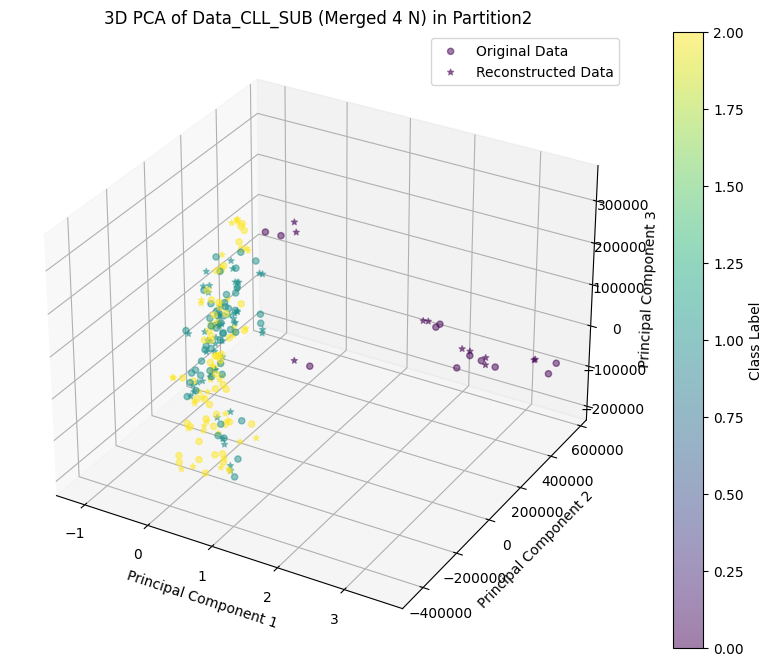

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition1/combined_train_2n.csv


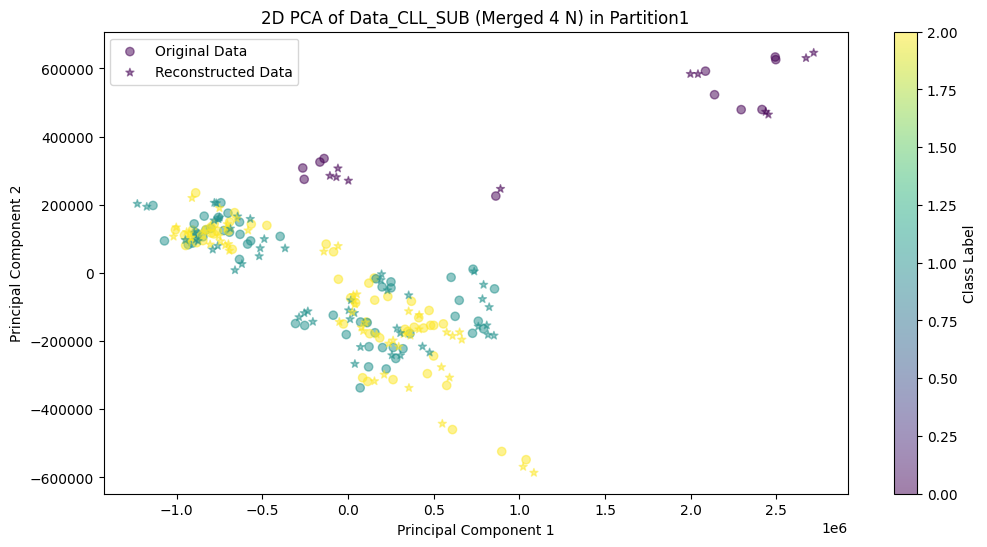

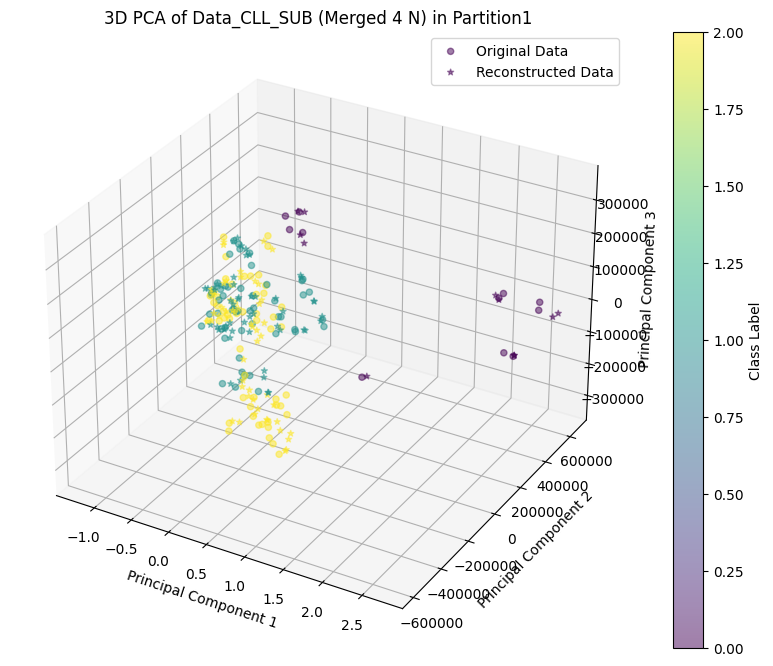

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition3/combined_train_2n.csv


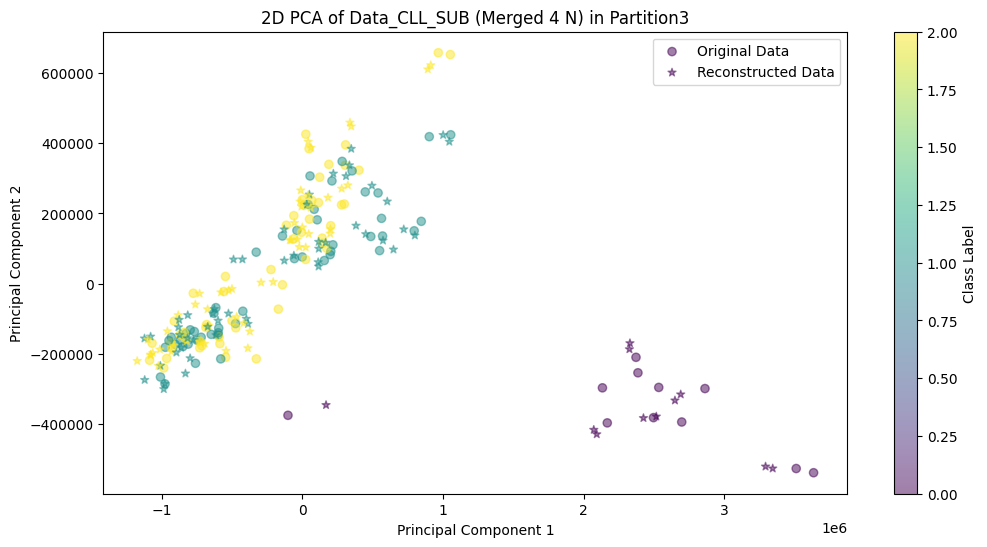

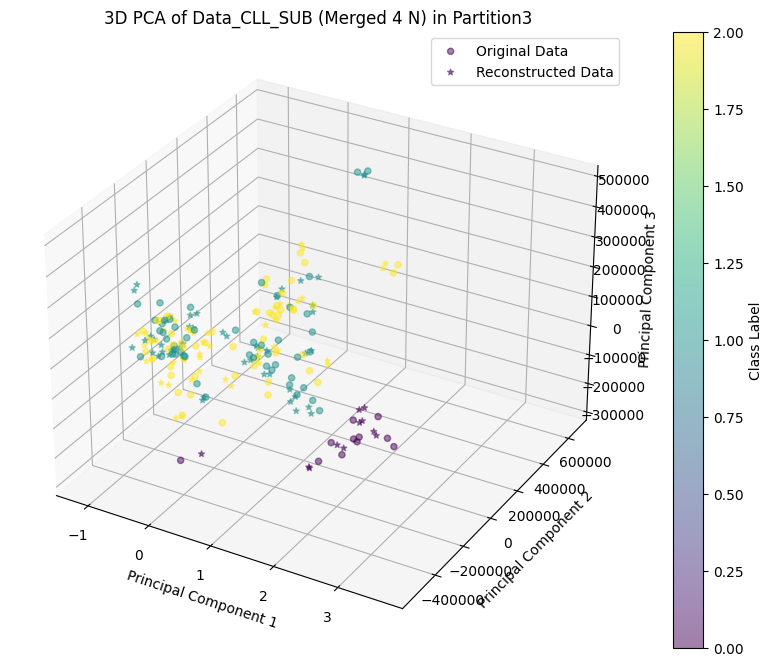

Processing /content/drive/MyDrive/Data/CLL_SUB/Partition5/combined_train_2n.csv


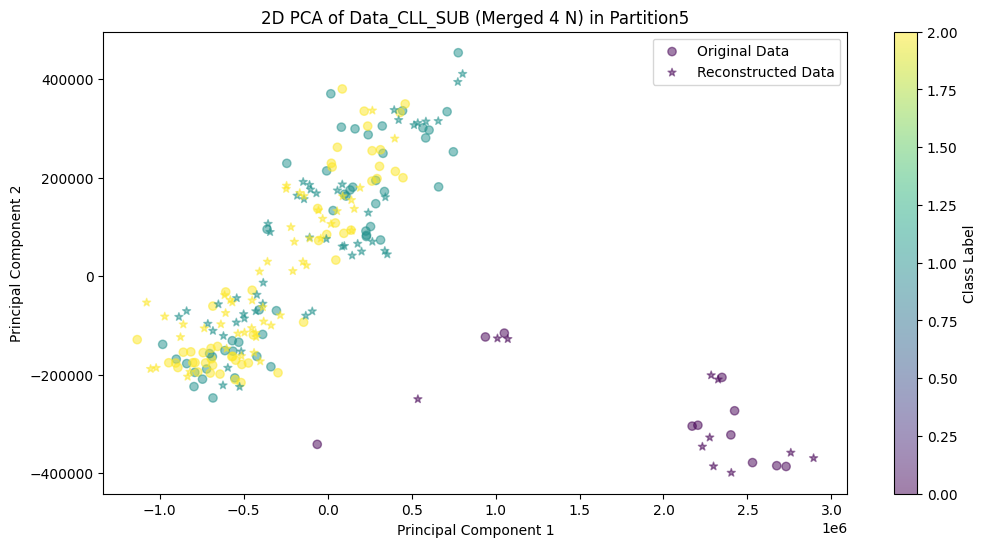

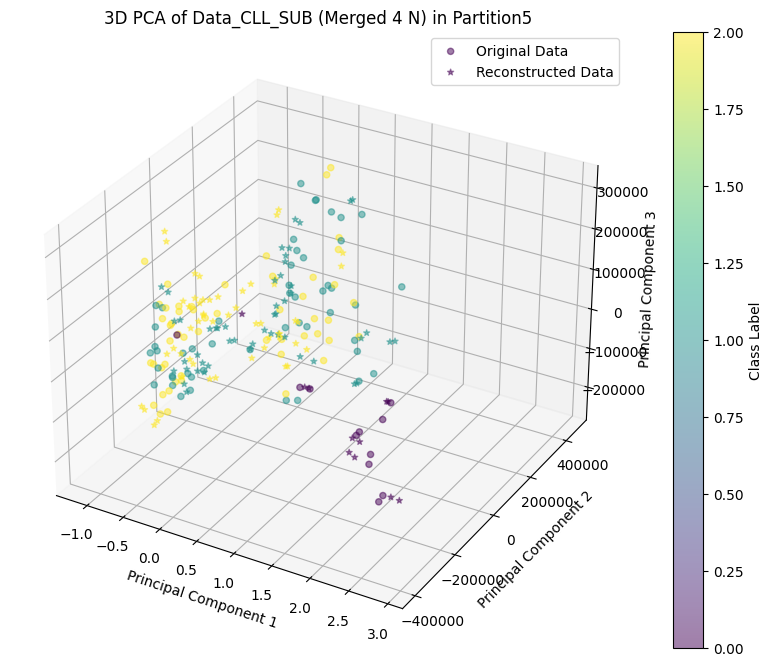

In [ ]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from torch import nn, optim
from torch.nn import functional as F
import torch.utils.data as Data
from mpl_toolkits.mplot3d import Axes3D  # Import necessary for 3D plotting

# Set the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class VAE(nn.Module):
    def __init__(self, data_dim):
        super(VAE, self).__init__()
        self.fc1 = nn.Linear(data_dim, 400)
        self.fc21 = nn.Linear(400, 20)  # Latent space dimension can be adjusted
        self.fc22 = nn.Linear(400, 20)
        self.fc3 = nn.Linear(20, 400)
        self.fc4 = nn.Linear(400, data_dim)

    def encode(self, x):
        h1 = F.relu(self.fc1(x))
        return self.fc21(h1), self.fc22(h1)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h3 = F.relu(self.fc3(z))
        return self.fc4(h3)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

def loss_function(recon_x, x, mu, logvar):
    MSE = F.mse_loss(recon_x, x, reduction='sum')
    KLD = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return MSE + KLD

def process_data(file_path):
    data = np.loadtxt(file_path, delimiter=',', skiprows=1)
    X = data[:, :-1]  # Features
    y = data[:, -1]   # Labels
    data_dim = X.shape[1]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    model = VAE(data_dim).to(device)
    optimizer = optim.Adam(model.parameters(), lr=1e-3)

    tensor_data = torch.tensor(X_scaled, dtype=torch.float32).to(device)
    data_loader = Data.DataLoader(tensor_data, batch_size=256, shuffle=True)

    model.train()
    for epoch in range(50):
        for data in data_loader:
            optimizer.zero_grad()
            reconstructed, mu, logvar = model(data)
            loss = loss_function(reconstructed, data, mu, logvar)
            loss.backward()
            optimizer.step()

    model.eval()
    with torch.no_grad():
        reconstructed, _, _ = model(tensor_data)
        reconstructed = reconstructed.cpu().numpy()

    original_data = scaler.inverse_transform(X_scaled)
    reconstructed_data = scaler.inverse_transform(reconstructed)

    combined_data = np.vstack((original_data, reconstructed_data))
    combined_labels = np.concatenate((y, y))
    output_array = np.hstack((combined_data, combined_labels.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'combined_train_4n.csv'), output_array, delimiter=',')

    # Save only the reconstructed data as augmented_n.csv
    augmented_data = np.hstack((reconstructed_data, y.reshape(-1, 1)))
    np.savetxt(os.path.join(os.path.dirname(file_path), 'augmented_2n.csv'), augmented_data, delimiter=',')

    df_tensor = torch.from_numpy(combined_data).float()
    df_tensor = df_tensor.to(device)

    x = df_tensor[:, :-1]
    y = df_tensor[:, -1].int()

    x = df_tensor[:, :-1].cpu().numpy()  # Convert to NumPy array and ensure it's on CPU for sklearn
    y = df_tensor[:, -1].int()
    from sklearn.decomposition import PCA
    # Apply PCA using sklearn
    pca = PCA(n_components=3)
    combined_data_pca = pca.fit_transform(x)

    # 2D PCA Plot
    plt.figure(figsize=(12, 6))
    plt.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                c=combined_labels[:len(original_data)], marker='o', label='Original Data', alpha=0.5, cmap='viridis')
    plt.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
                c=combined_labels[len(original_data):], marker='*', label='Reconstructed Data', alpha=0.5, cmap='viridis')
    plt.title(f'2D PCA of Data_CLL_SUB (Merged 4 N) in {os.path.basename(os.path.dirname(file_path))}')
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.colorbar(label='Class Label')
    plt.legend()
    plt.show()

    # 3D PCA Plot
    fig = plt.figure(figsize=(12, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(combined_data_pca[:len(original_data), 0], combined_data_pca[:len(original_data), 1],
                         combined_data_pca[:len(original_data), 2], c=combined_labels[:len(original_data)],
                         marker='o', label='Original Data', alpha=0.5, cmap='viridis')
    ax.scatter(combined_data_pca[len(original_data):, 0], combined_data_pca[len(original_data):, 1],
               combined_data_pca[len(original_data):, 2], c=combined_labels[len(original_data):],
               marker='*', label='Reconstructed Data', alpha=0.5, cmap='viridis')
    ax.set_title(f'3D PCA of Data_CLL_SUB (Merged 4 N) in {os.path.basename(os.path.dirname(file_path))}')
    ax.set_xlabel('Principal Component 1')
    ax.set_ylabel('Principal Component 2')
    ax.set_zlabel('Principal Component 3')
    fig.colorbar(scatter, ax=ax, label='Class Label')
    ax.legend()
    plt.show()

root_dir = '/content/drive/MyDrive/Data/CLL_SUB'

for subdir, dirs, files in os.walk(root_dir):
    for file in files:
        if file.endswith('combined_train_2n.csv'):
            file_path = os.path.join(subdir, file)
            print(f"Processing {file_path}")
            process_data(file_path)


In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'combined_train_2n.csv')
            test_file_path = os.path.join(full_path, 'test_data.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i+1}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Combined 2n: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy Combined 2n: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/CLL_SUB'
    main(folder_path)


Missing file in Partition19
Partition 1: RF Accuracy = 0.6111, KNN Accuracy = 0.5741
Partition 2: RF Accuracy = 0.6296, KNN Accuracy = 0.6111
Partition 3: RF Accuracy = 0.6481, KNN Accuracy = 0.5185
Partition 4: RF Accuracy = 0.6481, KNN Accuracy = 0.6111
Partition 5: RF Accuracy = 0.6111, KNN Accuracy = 0.5185
Partition 6: RF Accuracy = 0.6481, KNN Accuracy = 0.6296
Partition 7: RF Accuracy = 0.6296, KNN Accuracy = 0.5370
Partition 8: RF Accuracy = 0.7222, KNN Accuracy = 0.6481
Partition 9: RF Accuracy = 0.6481, KNN Accuracy = 0.5741
Partition 10: RF Accuracy = 0.7593, KNN Accuracy = 0.4630
Partition 11: RF Accuracy = 0.5926, KNN Accuracy = 0.4815
Partition 12: RF Accuracy = 0.6296, KNN Accuracy = 0.5185
Partition 13: RF Accuracy = 0.6296, KNN Accuracy = 0.5556
Partition 14: RF Accuracy = 0.6852, KNN Accuracy = 0.5741
Partition 15: RF Accuracy = 0.6667, KNN Accuracy = 0.5000
Partition 16: RF Accuracy = 0.6296, KNN Accuracy = 0.4444
Partition 17: RF Accuracy = 0.5741, KNN Accuracy = 0.

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'combined_train_4n.csv')
            test_file_path = os.path.join(full_path, 'test_data.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Combined 4n: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy of Combined 4n: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/CLL_SUB'
    main(folder_path)


Missing file in Partition19
Partition 0: RF Accuracy = 0.7222, KNN Accuracy = 0.6481
Partition 1: RF Accuracy = 0.6667, KNN Accuracy = 0.6481
Partition 2: RF Accuracy = 0.7222, KNN Accuracy = 0.4444
Partition 3: RF Accuracy = 0.6852, KNN Accuracy = 0.6296
Partition 4: RF Accuracy = 0.4815, KNN Accuracy = 0.5926
Partition 5: RF Accuracy = 0.5741, KNN Accuracy = 0.5741
Partition 6: RF Accuracy = 0.6852, KNN Accuracy = 0.5185
Partition 7: RF Accuracy = 0.6852, KNN Accuracy = 0.6296
Partition 8: RF Accuracy = 0.6111, KNN Accuracy = 0.5556
Partition 9: RF Accuracy = 0.6852, KNN Accuracy = 0.4444
Partition 10: RF Accuracy = 0.6481, KNN Accuracy = 0.5370
Partition 11: RF Accuracy = 0.6667, KNN Accuracy = 0.5556
Partition 12: RF Accuracy = 0.6852, KNN Accuracy = 0.5741
Partition 13: RF Accuracy = 0.6481, KNN Accuracy = 0.5741
Partition 14: RF Accuracy = 0.6852, KNN Accuracy = 0.5370
Partition 15: RF Accuracy = 0.5741, KNN Accuracy = 0.4815
Partition 16: RF Accuracy = 0.7222, KNN Accuracy = 0.5

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'train_data.csv')
            test_file_path = os.path.join(full_path, 'test_data.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Original Train Data: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy of Original Train Data: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/CLL_SUB'
    main(folder_path)


Missing file in Partition19
Partition 0: RF Accuracy = 0.6852, KNN Accuracy = 0.5556
Partition 1: RF Accuracy = 0.6852, KNN Accuracy = 0.5741
Partition 2: RF Accuracy = 0.7222, KNN Accuracy = 0.4815
Partition 3: RF Accuracy = 0.7037, KNN Accuracy = 0.5741
Partition 4: RF Accuracy = 0.6111, KNN Accuracy = 0.5556
Partition 5: RF Accuracy = 0.7037, KNN Accuracy = 0.5556
Partition 6: RF Accuracy = 0.5741, KNN Accuracy = 0.5926
Partition 7: RF Accuracy = 0.7037, KNN Accuracy = 0.5000
Partition 8: RF Accuracy = 0.6667, KNN Accuracy = 0.4630
Partition 9: RF Accuracy = 0.6111, KNN Accuracy = 0.5185
Partition 10: RF Accuracy = 0.6481, KNN Accuracy = 0.3889
Partition 11: RF Accuracy = 0.6852, KNN Accuracy = 0.5556
Partition 12: RF Accuracy = 0.6296, KNN Accuracy = 0.6111
Partition 13: RF Accuracy = 0.7037, KNN Accuracy = 0.5370
Partition 14: RF Accuracy = 0.6852, KNN Accuracy = 0.5556
Partition 15: RF Accuracy = 0.7037, KNN Accuracy = 0.4815
Partition 16: RF Accuracy = 0.6667, KNN Accuracy = 0.5

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'augmented_2n.csv')
            test_file_path = os.path.join(full_path, 'test_data.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy of Augmented 2n: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy of Augmented 2n: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/CLL_SUB'
    main(folder_path)


Missing file in Partition19
Partition 0: RF Accuracy = 0.5926, KNN Accuracy = 0.5926
Partition 1: RF Accuracy = 0.6111, KNN Accuracy = 0.6667
Partition 2: RF Accuracy = 0.6111, KNN Accuracy = 0.4630
Partition 3: RF Accuracy = 0.6667, KNN Accuracy = 0.7037
Partition 4: RF Accuracy = 0.5370, KNN Accuracy = 0.6296
Partition 5: RF Accuracy = 0.5926, KNN Accuracy = 0.5926
Partition 6: RF Accuracy = 0.5556, KNN Accuracy = 0.6111
Partition 7: RF Accuracy = 0.6852, KNN Accuracy = 0.6296
Partition 8: RF Accuracy = 0.5926, KNN Accuracy = 0.5185
Partition 9: RF Accuracy = 0.6481, KNN Accuracy = 0.5185
Partition 10: RF Accuracy = 0.4259, KNN Accuracy = 0.4074
Partition 11: RF Accuracy = 0.6667, KNN Accuracy = 0.5556
Partition 12: RF Accuracy = 0.5926, KNN Accuracy = 0.5000
Partition 13: RF Accuracy = 0.5926, KNN Accuracy = 0.6481
Partition 14: RF Accuracy = 0.5370, KNN Accuracy = 0.5370
Partition 15: RF Accuracy = 0.6481, KNN Accuracy = 0.5000
Partition 16: RF Accuracy = 0.5185, KNN Accuracy = 0.5

In [ ]:
import os
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score

def load_data_from_folder(folder_path):
    train_data_list = []
    test_data_list = []

    for sub_folder in sorted(os.listdir(folder_path)):
        full_path = os.path.join(folder_path, sub_folder)
        if os.path.isdir(full_path):
            train_file_path = os.path.join(full_path, 'augmented_n.csv')
            test_file_path = os.path.join(full_path, 'test_data.csv')

            try:
                train_data = pd.read_csv(train_file_path)
                test_data = pd.read_csv(test_file_path)

                # Assuming the last column is the target
                train_data_list.append(train_data.values)
                test_data_list.append(test_data.values)

            except FileNotFoundError:
                print(f"Missing file in {sub_folder}")
            except Exception as e:
                print(f"An error occurred while loading data from {sub_folder}: {e}")

    return train_data_list, test_data_list

def main(folder_path):
    train_data_list, test_data_list = load_data_from_folder(folder_path)
    mean_acc_rf = []
    mean_acc_knn = []

    for i, (train_data, test_data) in enumerate(zip(train_data_list, test_data_list)):
        X_train, y_train = train_data[:, :-1], train_data[:, -1]
        X_test, y_test = test_data[:, :-1], test_data[:, -1]

        # Train RandomForest model
        rf_model = RandomForestClassifier(n_estimators=100)
        rf_model.fit(X_train, y_train)
        rf_predictions = rf_model.predict(X_test)
        rf_accuracy = accuracy_score(y_test, rf_predictions)
        mean_acc_rf.append(rf_accuracy)

        # Train KNN model
        knn_model = KNeighborsClassifier(n_neighbors=5)
        knn_model.fit(X_train, y_train)
        knn_predictions = knn_model.predict(X_test)
        knn_accuracy = accuracy_score(y_test, knn_predictions)
        mean_acc_knn.append(knn_accuracy)

        print(f"Partition {i}: RF Accuracy = {rf_accuracy:.4f}, KNN Accuracy = {knn_accuracy:.4f}")

    # Calculate and print mean accuracy for each model
    mean_accuracy_rf = sum(mean_acc_rf) / len(mean_acc_rf)
    mean_accuracy_knn = sum(mean_acc_knn) / len(mean_acc_knn)
    print(f"Mean RF Accuracy  of Augmented n: {mean_accuracy_rf:.4f}")
    print(f"Mean KNN Accuracy Augmented n: {mean_accuracy_knn:.4f}")

if __name__ == "__main__":
    folder_path = '/content/drive/MyDrive/Data/CLL_SUB'
    main(folder_path)


Missing file in Partition19
Partition 0: RF Accuracy = 0.5926, KNN Accuracy = 0.5741
Partition 1: RF Accuracy = 0.6481, KNN Accuracy = 0.5926
Partition 2: RF Accuracy = 0.6852, KNN Accuracy = 0.5370
Partition 3: RF Accuracy = 0.6111, KNN Accuracy = 0.5926
Partition 4: RF Accuracy = 0.5370, KNN Accuracy = 0.5556
Partition 5: RF Accuracy = 0.6111, KNN Accuracy = 0.5741
Partition 6: RF Accuracy = 0.5926, KNN Accuracy = 0.5370
Partition 7: RF Accuracy = 0.6296, KNN Accuracy = 0.6296
Partition 8: RF Accuracy = 0.5556, KNN Accuracy = 0.5370
Partition 9: RF Accuracy = 0.6296, KNN Accuracy = 0.4630
Partition 10: RF Accuracy = 0.5926, KNN Accuracy = 0.4259
Partition 11: RF Accuracy = 0.6111, KNN Accuracy = 0.4815
Partition 12: RF Accuracy = 0.6111, KNN Accuracy = 0.5000
Partition 13: RF Accuracy = 0.6111, KNN Accuracy = 0.5370
Partition 14: RF Accuracy = 0.6481, KNN Accuracy = 0.6111
Partition 15: RF Accuracy = 0.5926, KNN Accuracy = 0.5370
Partition 16: RF Accuracy = 0.6296, KNN Accuracy = 0.4

In [ ]:
import pandas as pd

# Load the data
df = pd.read_pickle('/content/drive/MyDrive/Data/GLIOMA/Partition0/SLCE_features.p')

# Check the type of df
df_1 = pd.read_pickle('/content/drive/MyDrive/Data/GLIOMA/Partition0/trnData.p')
#print(df_1)
# Assuming df is already a loaded tensor object
# Convert the first 50 elements of the tensor to a list
first_50_elements = df[:50].tolist()

# Print the list
print(first_50_elements)

df_1=df_1[:,first_50_elements]
print(df_1.shape)


[1870, 118, 89, 3843, 419, 4423, 996, 202, 628, 4419, 739, 1223, 3337, 486, 4433, 1648, 3686, 3209, 2059, 3384, 3562, 1747, 164, 738, 1755, 4413, 1499, 2870, 4346, 277, 554, 2427, 449, 1907, 2650, 3764, 3353, 2292, 2823, 3693, 2331, 4403, 3435, 2948, 2617, 2500, 3399, 2668, 3712, 3407]
(26, 50)
